# Script aiming at deriving signatures of embryo head muscles ( visium HD- pcw8 - human)
Author: Naomie Pont

Activate kernel linked to conda environment st_env

**Set-up**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import matplotlib.ticker as ticker
import anndata
import geopandas as gpd
import scanpy as sc
import seaborn as sns
import glob
import os

from skimage.io import imread as imread_jpeg
from tifffile import imread as imread_tif
from tifffile import imwrite
from csbdeep.utils import normalize
from stardist.models import StarDist2D
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap

# For enrichment scores
import decoupler as dc
import omnipath as op #installed with "conda install conda-forge::omnipath" to avoid conflicts when using "pip install omnipath"

# For DEA
#from pydeseq2.dds import DeseqDataSet, DefaultInference
#from pydeseq2.ds import DeseqStats


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

bioimageio_utils.py (2): pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
auto.py (21): IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
2026-04-22 16:51:28 | [INFO] Downloading data from `https://omnipathdb.org/queries/enzsub?format=json`
2026-04-22 16:51:28 | [INFO] Downloading data from `https://omnipathdb.org/queries/interactions?format=json`
2026-04-22 16:51:28 | [INFO] Downloading data from `https://omnipathdb.org/queries/complexes?format=json`
2026-04-22 16:51:28 | [INFO] Downloading data from `https://omnipathdb.org/queries/annotations?format=json`
2026-04-22 16:51:28 | [INFO] Downloading data from `https://omnipathdb.org/queries/intercell?format=json`
2026-04-22 16:51:29 | [INFO] Downloading data from `https://omnipathdb.org/

In [3]:
adata = sc.read_h5ad("./AnnData_Objects/D1_embryo_head_with_anatomical_clusters.h5ad")
adata_muscle = adata[adata.obs["anatomical_cluster"] != "None"]

## Heatmaps - Known markers on anatomical clusters

847843819.py (13): Trying to modify attribute `.obs` of view, initializing view as actual.


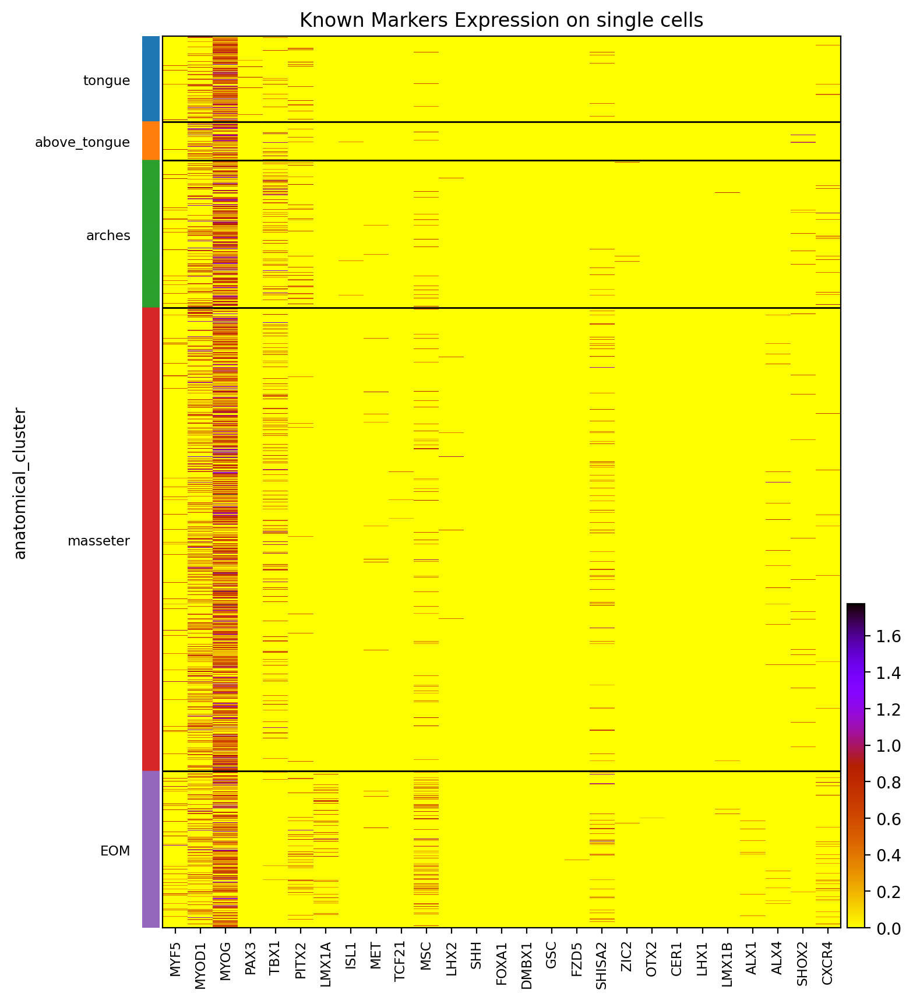

In [4]:
### Log-normalized counts ###

markers=["MYF5", "MRF4", "MYOD1", "MYOG","PAX3", "TBX1", "PITX2", "LMX1A", "ISL1", "MET", "TCF21", "MSC", "LHX2", "SHH", "FOXA1", "DMBX1",  "GSC", "FZD5",  "SHISA2", "ZIC2",  "OTX2","CER1","LHX1", "LMX1B", "RIPPLY", "ALX1",  "ALX4", "SHOX2",  "CXCR4", "SDF1"]


# Check which genes are in adata
present_markers = [g for g in markers if g in adata.var_names]
absent_markers = [g for g in markers if g not in adata.var_names]

adata_muscle = adata[adata.obs["anatomical_cluster"]!="None"]

# Order for plotting (top to bottom of heatmap)
adata_muscle.obs["anatomical_cluster"] = adata_muscle.obs["anatomical_cluster"].cat.reorder_categories(
    [ "tongue", "above_tongue", "arches", "masseter", "EOM"],
    ordered=True
)

heatmap=sc.pl.heatmap(
    adata=adata_muscle,
    use_raw = False,
    groupby="anatomical_cluster",
    var_names=present_markers,
    cmap="gnuplot_r",
    figsize=(8,10),
    show=False
)

heatmap["heatmap_ax"].set_title("Known Markers Expression on single cells")
plt.show()

In [5]:
print(f"{absent_markers} are not in the adata object")

['MRF4', 'RIPPLY', 'SDF1'] are not in the adata object


# Transcription Factors Enrichment Analysis

Enrichment of TF across clusters & Pseudobulk Generation.

ULM incorporates weights of TF-gene (i.e. source-target) interactions.

The scores from decoupler.mt.ulm() should be interpreted such that larger magnitudes indicate greater significance, while the sign reflects whether the features in the set are overrepresented (positive) or underrepresented (negative) compared to the background.

Recall: the enrichment analysis using Univariate Linear Model (ulm) fits a linear predictor to the genes expression profile of each sample using as predictors the interaction weights of the genes targets of TFs. Then it applies a regression t-test to check whether the fitted line is good. In other words, if the TF whose targets approximate the gene expression profile is active. The t value is the Enrichment Score (ES). Positive ES means enrichment of TF, depletion otherwise. 

## Pseudobulk Level. Considering only muscles.

https://decoupler.readthedocs.io/en/latest/notebooks/scell/rna_psbk.html 
1. Subset cell type of interest
2. Extract their raw integer counts
3. Sum up (or different aggregation mode through param "mode") their counts per gene to have a cell-type profile of the gene (if cells pass QC control)

### 1. Pseudobulks Generation

#### Method1: same number of pseudobulk samples in all anatomical clusters 

Pseudobulk samples have **same size within** each anatomical clusters, but **distinct sizes across** anatomical clusters. Consequently big anatomical clusters have bigger pseudobulks.

See in PCA below (in QC) that drives variation in PCA, because big pseudobulks drive PC2 (masseter).

#### Method2: pseudobulk samples of same size

Consequently, different number of pseudobulk samples in each anatomical cluster -> bigger anatomical clusters have more pseudobulk samples.

In [6]:
######## Parameters #######

# Define the size of your pseudobulk samples
CELLS_PER_PSEUDOBULK = 30 #20 #15
# Define the minimum number of cells for a group to be included
MIN_CELLS_PER_GROUP = 18 #18 #15

################################



def add_pseudobulk_id_distributed(
    adata,
    group_col: str,
    sample_size: int,
    obs_key: str = 'pseudobulk_id',
    min_cells: int = 10,
    seed: int = 0
):
    """
    Assigns pseudobulk IDs by distributing leftover cells.

    This function creates pseudobulks of size `sample_size` or `sample_size + 1`.
    Leftover cells in a group are distributed one by one to the existing
    pseudobulks of that group, ensuring maximum balance in size.

    Parameters
    ----------
    adata
        The AnnData object.
    group_col
        The column in `adata.obs` to group by (e.g., 'anatomical_cluster').
    sample_size
        The target number of cells per pseudobulk.
    obs_key
        The name of the new column to be added to `adata.obs`.
    min_cells
        The minimum number of cells required for a group to be considered at all.
        Groups smaller than this are discarded. Groups larger than this but smaller
        than `sample_size` will form a single pseudobulk.
    seed
        Random seed for reproducibility.
    """
    np.random.seed(0)
    
    pseudobulk_ids = pd.Series(index=adata.obs_names, dtype=str)

    # Iterate over each group
    for group_name, group_df in adata.obs.groupby(group_col):
        n_cells = len(group_df)
        
        # Skip groups smaller than the minimum required size
        if n_cells < min_cells:
            continue
            
        # Shuffle the cell indices within the group for random assignment
        shuffled_indices = np.random.permutation(group_df.index)
        
        # Calculate the number of pseudobulks and the number of leftovers
        n_bulks = n_cells // sample_size
        n_leftover = n_cells % sample_size

        # If the group is too small to split, treat it as a single pseudobulk
        if n_bulks == 0:
            pseudobulk_ids.loc[shuffled_indices] = '0'
            continue

        # Define the size of each pseudobulk
        # The first `n_leftover` bulks get an extra cell
        sizes = [sample_size + 1] * n_leftover + [sample_size] * (n_bulks - n_leftover)
        
        # Assign cells to pseudobulks based on the calculated sizes
        current_pos = 0
        for i, size in enumerate(sizes):
            end_pos = current_pos + size
            cell_indices = shuffled_indices[current_pos:end_pos]
            pseudobulk_ids.loc[cell_indices] = str(i)
            current_pos = end_pos
            
    # Add the new column to adata.obs
    adata.obs[obs_key] = pseudobulk_ids
    
    # Create a new object without the unassigned cells
    adata_filtered = adata[~adata.obs[obs_key].isna()].copy()
   
    return adata_filtered


# Generate pseudobulk id
adata_muscle = add_pseudobulk_id_distributed(
    adata=adata_muscle,
    group_col='anatomical_cluster',
    sample_size=CELLS_PER_PSEUDOBULK,
    min_cells=MIN_CELLS_PER_GROUP,
    obs_key='pseudobulk_id'
)


4158949625.py (49): The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


### 2. Quality Control 

In [7]:
### Verification ###
pb_sample_counts = adata_muscle.obs.groupby(['anatomical_cluster', 'pseudobulk_id']).size()

print("Anatomical cluster | # cells in pseudobulk | # nb of pseudobulks:")
print(pb_sample_counts.groupby('anatomical_cluster').value_counts())


Anatomical cluster | # cells in pseudobulk | # nb of pseudobulks:
anatomical_cluster    
tongue              0     31
                    30     6
                    31     1
                    2      0
                    14     0
above_tongue        0     34
                    31     3
                    2      1
                    14     0
                    30     0
arches              0     26
                    30     9
                    31     3
                    2      0
                    14     0
masseter            30    38
                    0      0
                    2      0
                    14     0
                    31     0
EOM                 0     25
                    31    12
                    14     1
                    2      0
                    30     0
Name: count, dtype: int64


4125235850.py (2): The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
4125235850.py (5): The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [8]:
## Common to both methods: pseudobulk generation ##
# will pseudobulk cells from same cluster and same pseudobulk_id

pdata_muscle = dc.pp.pseudobulk(
    adata=adata_muscle,
    sample_col='pseudobulk_id',      # sample identifier
    groups_col='anatomical_cluster', # grouping column
    raw=True,
    mode='sum'
)

Quality Control of Pseudobulks (before filtering):


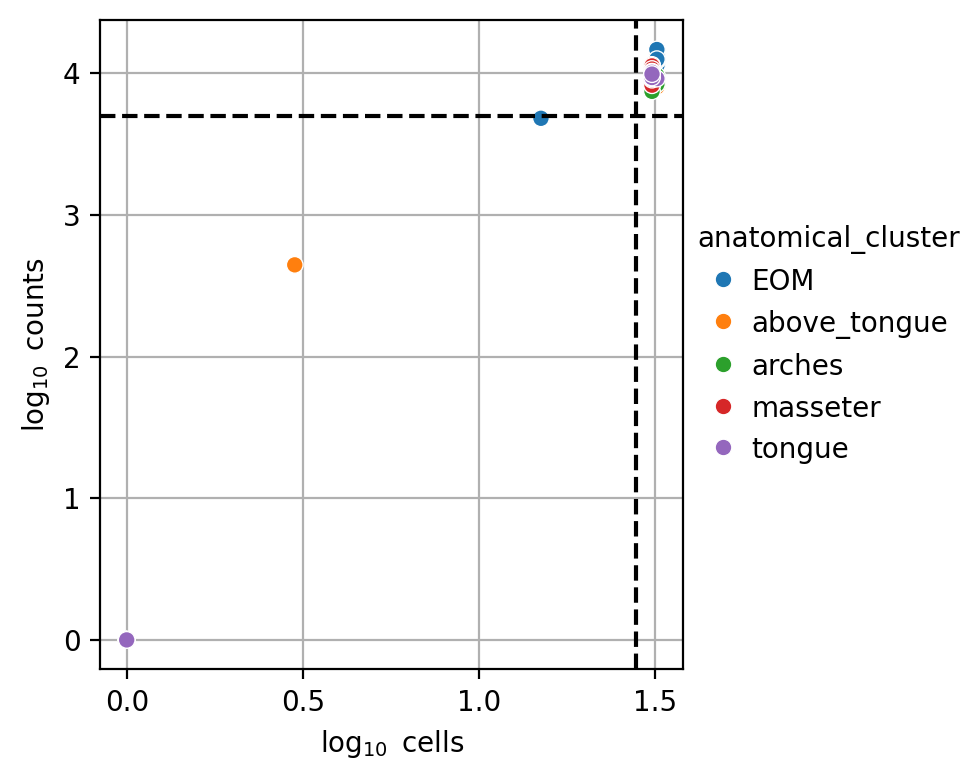

In [9]:
# QC #
dc.pl.filter_samples(
    adata=pdata_muscle,
    groupby=["anatomical_cluster"],
    min_cells=28, #x-axis: vertical dashed line
    min_counts=5000, #y-axis: horizontal dashed line
    figsize=(5, 4),
)
print("Quality Control of Pseudobulks (before filtering):")

Set filtering thresholds based on previous plot:
- min_cells: minimum number of cells in a pseudobulk sample
- min_counts: minimum number of summed total counts of all cells of a pseudobulk sample

In [10]:
# Filtering #
dc.pp.filter_samples(pdata_muscle, min_cells=28, min_counts=5000) #28,#5000

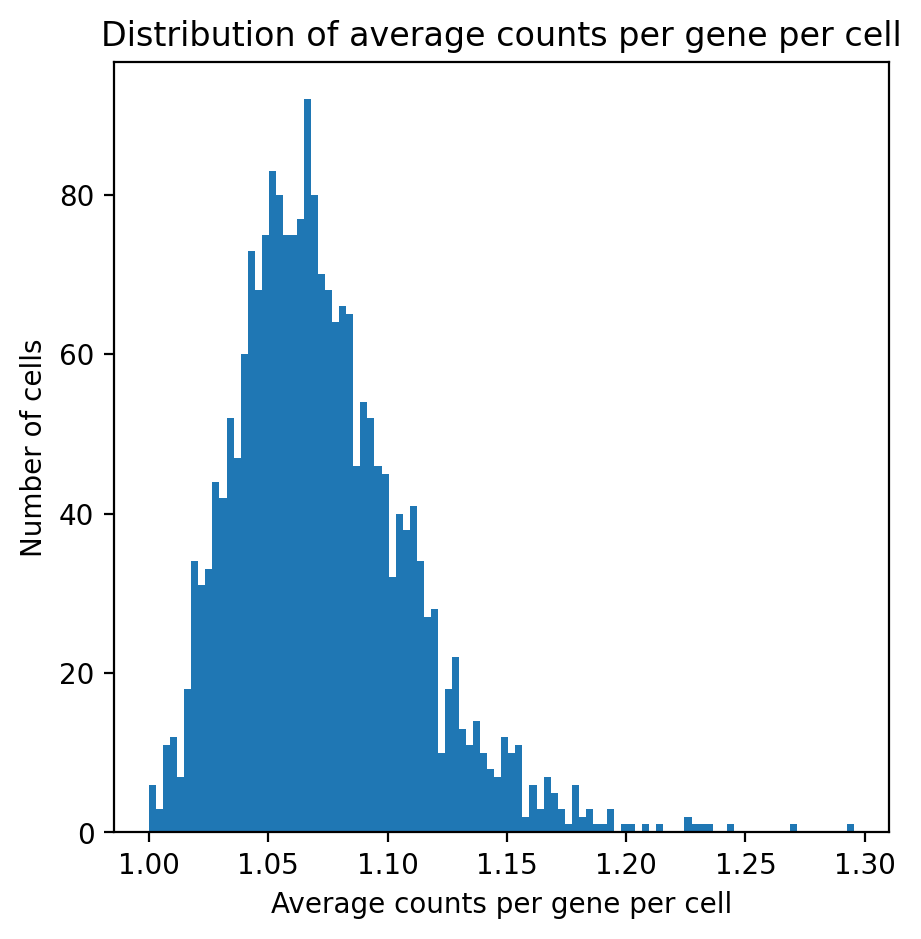

In [11]:
## Inspect signal: nb of counts per gene per cell ##
# Goal: compare to the counts per gene per pseudobulk sample 

# Total nb of counts in each cell: adata_muscle.obs["total_counts"]
# Nb of expressed genes per cell (nb of genes with at least one count): adata_muscle.obs["n_genes_by_counts"]

# Average counts per gene per cell
adata_muscle.obs["avg_counts_per_gene_per_cell"] = adata_muscle.obs["total_counts"] / adata_muscle.obs["n_genes_by_counts"]

plt.figure(figsize=(5, 5))  
plt.hist(adata_muscle.obs["avg_counts_per_gene_per_cell"], bins=100)
plt.xlabel('Average counts per gene per cell')
plt.ylabel('Number of cells')
plt.title('Distribution of average counts per gene per cell')
plt.show()

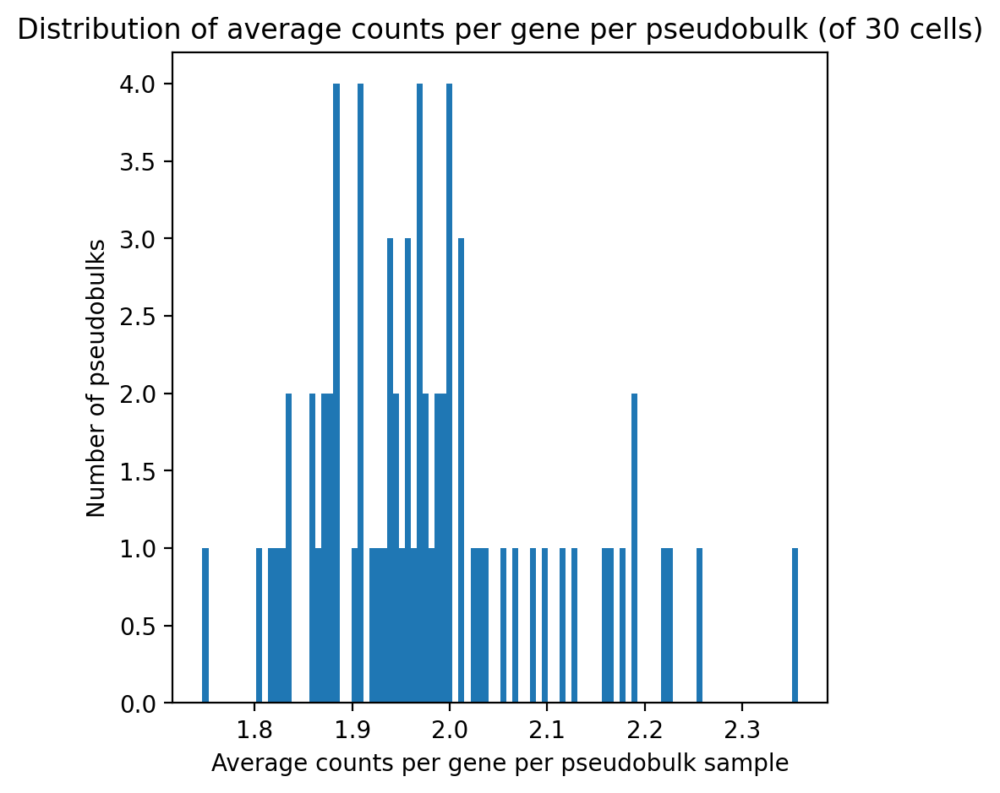

In [12]:
sc.pp.calculate_qc_metrics(pdata_muscle, inplace=True)

# total counts per pseudobulk sample: pdata_muscle.obs["psbulk_counts"]

# nb of expressed genes in each pseudobulk sample: pdata_muscle.obs["n_genes_by_counts"]

pdata_muscle.obs["avg_counts_per_gene_per_pseudobulk"] = pdata_muscle.obs["psbulk_counts"] / pdata_muscle.obs["n_genes_by_counts"] 
plt.figure(figsize=(5, 5))  
plt.hist(pdata_muscle.obs["avg_counts_per_gene_per_pseudobulk"], bins=100)
plt.xlabel('Average counts per gene per pseudobulk sample')
plt.ylabel('Number of pseudobulks')
plt.title(f'Distribution of average counts per gene per pseudobulk (of {CELLS_PER_PSEUDOBULK} cells)')
plt.show()

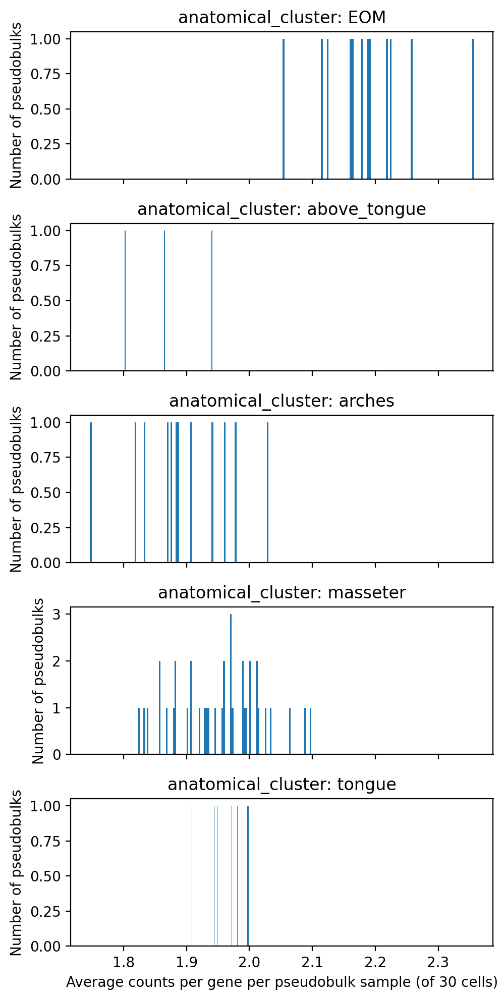

In [13]:
clusters = pdata_muscle.obs["anatomical_cluster"].unique()
n = len(clusters)

fig, axes = plt.subplots(n, 1, figsize=(5, 2*n), sharex=True)
for i, cluster in enumerate(clusters):
    subset = pdata_muscle.obs[pdata_muscle.obs["anatomical_cluster"] == cluster]
    axes[i].hist(subset["avg_counts_per_gene_per_pseudobulk"], bins=100)
    axes[i].set_title(f'anatomical_cluster: {cluster}')
    axes[i].set_ylabel('Number of pseudobulks')
axes[-1].set_xlabel(f'Average counts per gene per pseudobulk sample (of {CELLS_PER_PSEUDOBULK} cells)')
plt.tight_layout()
plt.show()

Quality Control of Pseudobulks, after filtering:


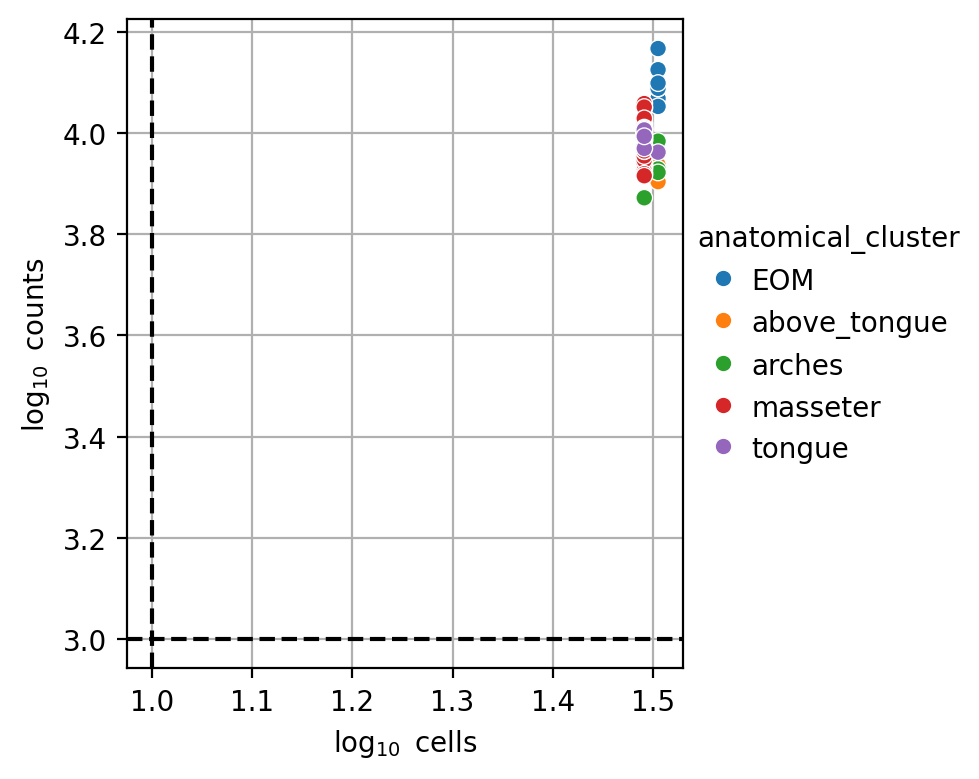

In [14]:
# Visualize remaining profiles #
dc.pl.filter_samples(
    adata=pdata_muscle,
    groupby=["anatomical_cluster"],
    figsize=(5, 4),
)

print("Quality Control of Pseudobulks, after filtering:")

In [15]:
# Explore pseudobulk variability & preprocessing steps #

# Save raw counts of DeSeq that works on un-normalized data
pdata_muscle.layers["counts"] = pdata_muscle.X.copy()

# Normalize, scale and compute pca
sc.pp.normalize_total(pdata_muscle, target_sum=1e4)
sc.pp.log1p(pdata_muscle)
sc.pp.scale(pdata_muscle, max_value=10)
sc.tl.pca(pdata_muscle)

# Return raw counts to X
dc.pp.swap_layer(adata=pdata_muscle, key="counts", inplace=True)

In [16]:
dc.tl.rankby_obsm(pdata_muscle, key="X_pca")
#sc.pl.pca_variance_ratio(pdata_muscle)

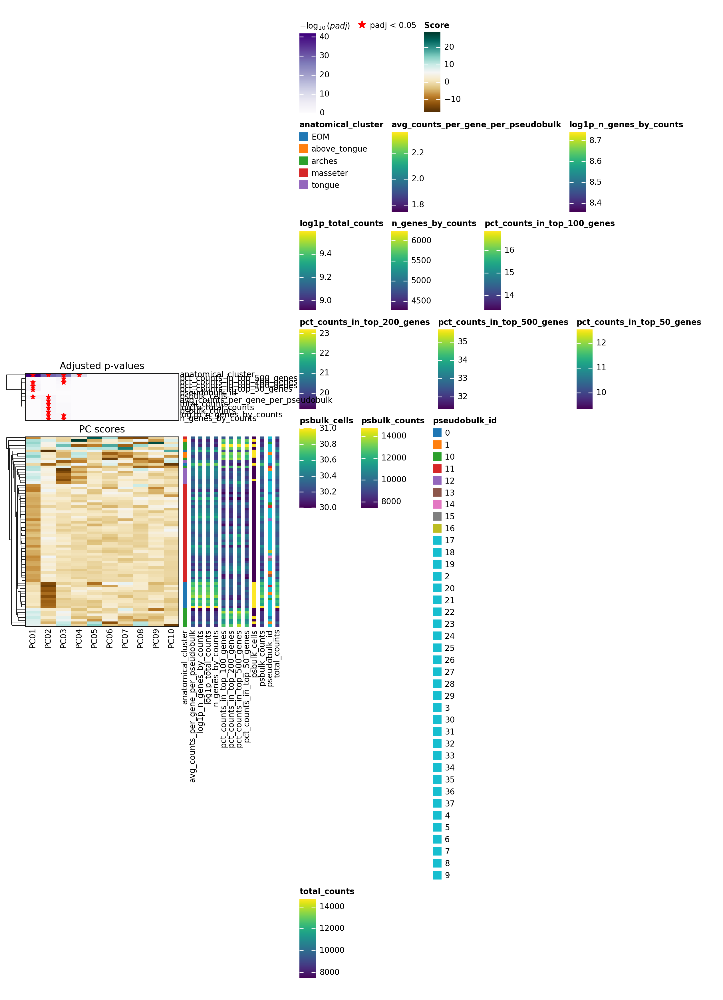

In [17]:
dc.pl.obsm(adata=pdata_muscle, return_fig=True, nvar=10, titles=["PC scores", "Adjusted p-values"], figsize=(10, 5))

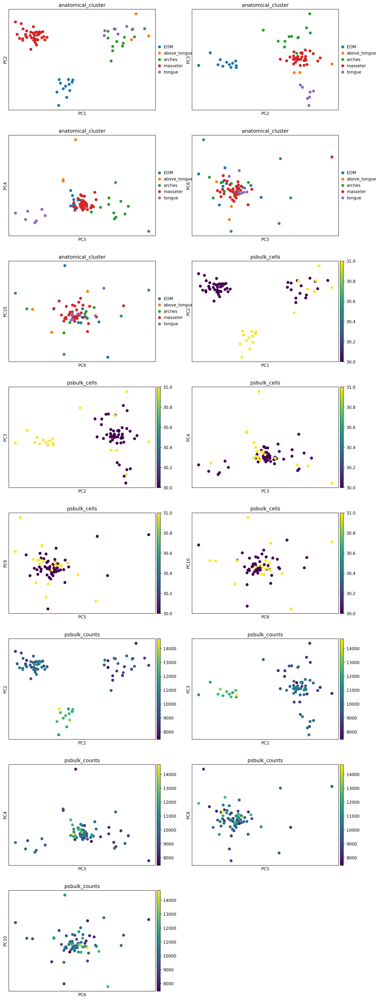

In [18]:
# Plot metadata variables on PC space, for the metadata variables associated with PC capturing susbtancial amount of variance
# i.e. rows w/ a star (metadata) are associated w/ PCs on the corresponding column in the top plot
# and are possible covariates in DEA or enrichment analysis

sc.pl.pca(
    pdata_muscle,
    color=["anatomical_cluster", "psbulk_cells", "psbulk_counts"],
    components=['1,2', '2,3', '3,4', '5,6', '6,10'],
    ncols=2,
    size=200,
    frameon=True,
)

Method2 for pseudobulking (i.e. forcing the same nb of cells per pseudobulk samples, across all anatomical clusters) leads to less cofounding variables:  pseudobulk_counts drives just a bit variability (=not a strong gradient along on PC axis) while it strongly drove variability in Method1 (especially for masseter) where we forced to have the same nb of pseudobulks across clusters and thus different nb of cells per pseudobulks. Also, anatomical clusters are clearly separated in PCA space of PC1 and PC2.

*Note:* maybe we'll have to randomly draw pseudobulks during DEA (see notebook DEA_DESeq2.ipynb) to equilibrate effectifs for differential testing.  

#### Heatmap - Gene Expression

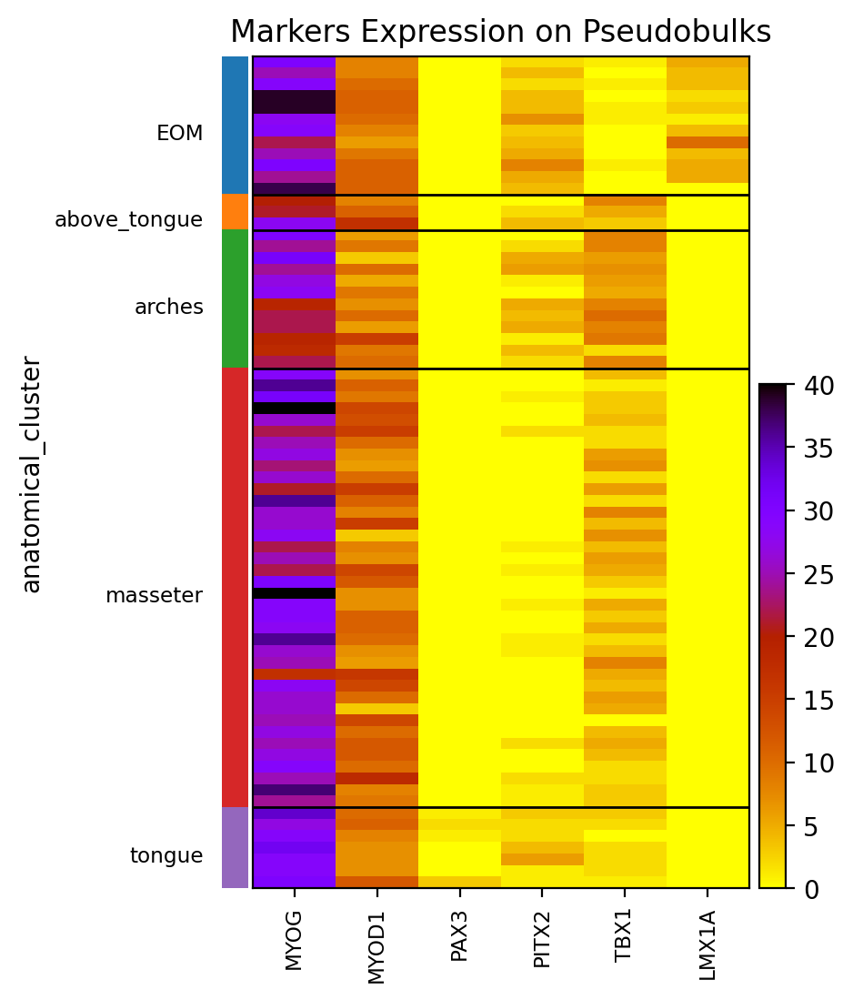

In [19]:
markers=["MYOG", "MYOD1", "PAX3", "PITX2", "TBX1", "LMX1A"]
present_markers = [g for g in markers if g in pdata_muscle.var.index]

heatmap=sc.pl.heatmap(
    adata=pdata_muscle,
    use_raw = False,
    groupby="anatomical_cluster",
    var_names=present_markers,
    cmap="gnuplot_r",
    figsize=(4,6),
    show=False
)

heatmap['heatmap_ax'].set_title('Markers Expression on Pseudobulks')
plt.show()

### 3. Genes Filtering
In DEA, for each gene we test if it's differentially expressed between cells/conditions. Thus we obtain one p-value per gene. 
If we have 10'000 genes, tested with level of significance 0.05, we have a risk of having 500 false positives. Highlighting the need for multiple comparisons correction and pre-filtering of genes (or dim reduction) to test less genes.

In [20]:
pdata_muscle

AnnData object with n_obs × n_vars = 72 × 18085
    obs: 'pseudobulk_id', 'anatomical_cluster', 'psbulk_cells', 'psbulk_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'avg_counts_per_gene_per_pseudobulk'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'rank_obsm', 'anatomical_cluster_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props', 'counts', 'X'

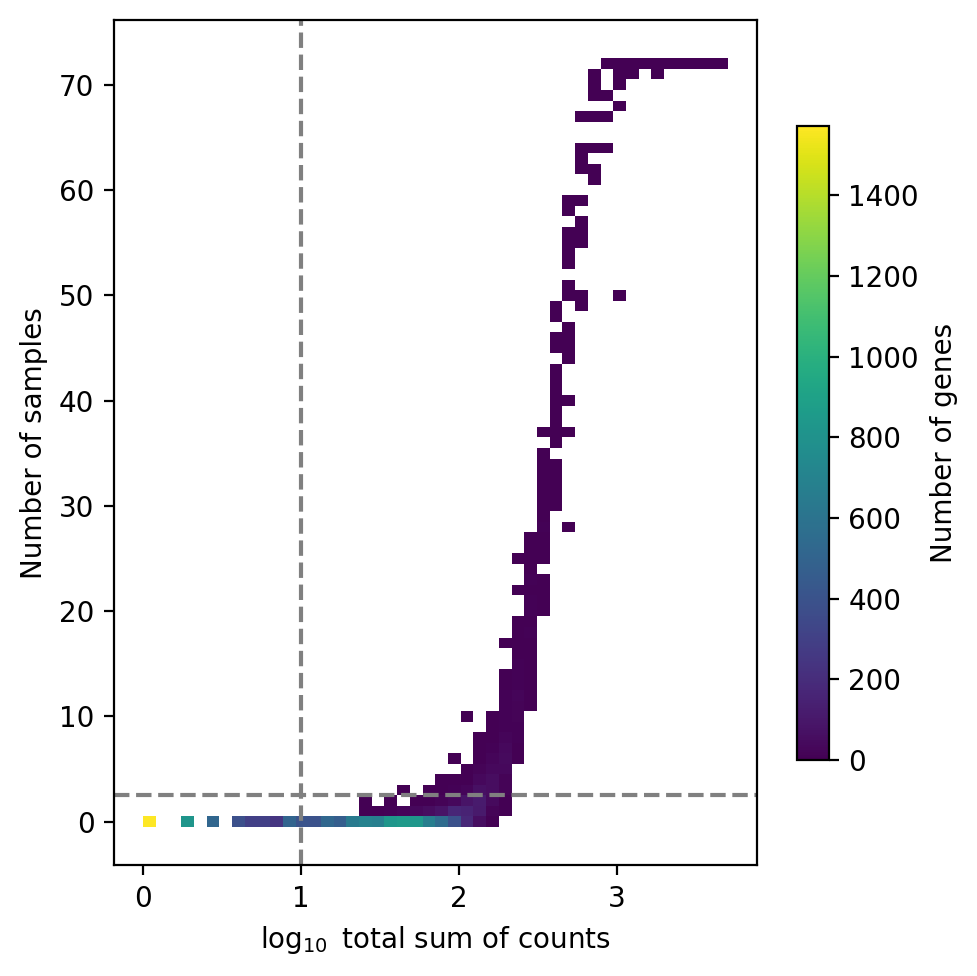

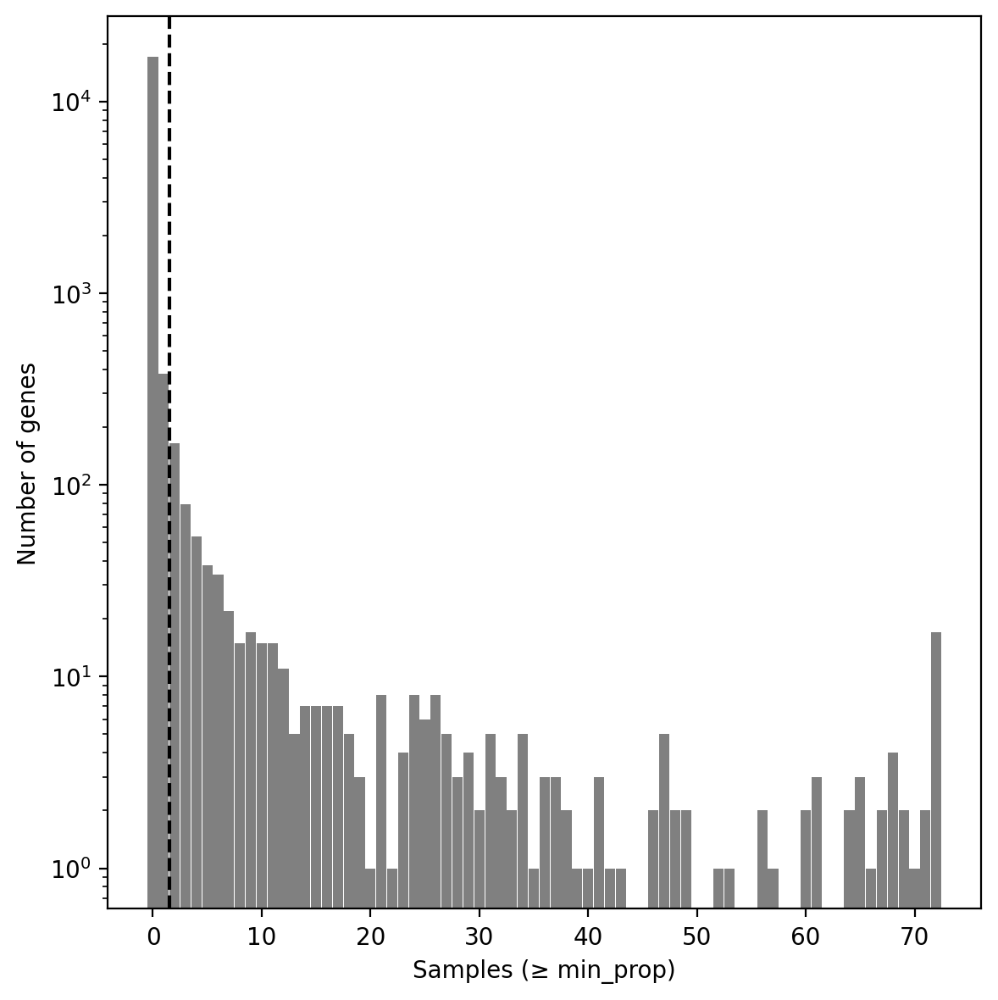

In [21]:
# QC plots used to decide on the genes filtering thresholds

fig = dc.pl.filter_by_expr(
    adata=pdata_muscle,
    group="anatomical_cluster",
    min_count=5, #threshold "minimum number of counts in a given number of samples"
    min_total_count=10, #threshold "minimum total number of reads across all samples" ie x-axis value
    min_prop=0.2, #proportion of samples in the smallest group that should express a gene
    return_fig=True
) #genes in upper right quadrant will be retained
# each bar is a gene. see that increasing min_count show less genes on plot. 

# Note: y-axis horizontal dashed line is the smallest nb of pseudobulk samples in group
# in our case: above tongue has only 6 pseudobulks, and it's the group with the lowest nb of pseudobulks, so the line is at 6

ax = fig.axes[0]  
ymin, ymax = ax.get_ylim()
ax.set_yticks(np.arange(0, int(ymax)+1, 10)) #ytick every 10 units
fig.set_size_inches(5, 5)
fig.tight_layout()
fig.show()

#retains genes expressed in at least "min_prop" proportion of cells across "min_smpls" samples
# in other words: selects genes that are sufficiently expressed across cells in each sample and check that this condition is met across a minimum number of samples
fig_2 = dc.pl.filter_by_prop(
    adata=pdata_muscle,
    min_prop=0.2, 
    min_smpls=2, 
    return_fig=True
) #genes to the right of vertical line will be retained
# Heuristic, but usually if there is a bimodal distribution we filter the left part that most likely is noise

fig_2.set_size_inches(6, 6)
fig_2.tight_layout()
fig_2.show()

**Choose type of filtering:**

In [22]:

###### Parameters #######
filter_by_expr = False
filter_by_prop = True
#########################


In [23]:
if filter_by_expr:
    dc.pp.filter_by_expr(
        adata=pdata_muscle,
        group="anatomical_cluster",
        min_count=5, # a gene is kept if expressed with at leat 5 counts in the pseudobulk
        min_total_count=10, # a gene is kept if expressed with at least 10 counts in the anatomical cluster
        min_prop=0.4, # if using 30 cells per pseudobulk: smallest group is above tongue, and has 3 samples. So require at least that a gene is expressed in one of its samples i.e. min_prop=1/3
    )

    pdata_muscle

In [24]:
if filter_by_prop:
    dc.pp.filter_by_prop(
        adata=pdata_muscle,
        min_prop=0.2,
        min_smpls=2
    )
    pdata_muscle

In [25]:
pdata_muscle

AnnData object with n_obs × n_vars = 72 × 642
    obs: 'pseudobulk_id', 'anatomical_cluster', 'psbulk_cells', 'psbulk_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'avg_counts_per_gene_per_pseudobulk'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'rank_obsm', 'anatomical_cluster_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props', 'counts', 'X'

**For pseudobulks of 20 cells:**

- If min_count = 10, we end up with only 43 genes.
- If min_count = 5, we end up with 145 genes.
- If using only filter_by_prop, requiring genes to be expressed in at least 10 % of min 2 samples, we end up with 7639 genes. 
- If using only filter_by_prop, requiring genes to be expressed in at least 30 % of min 5 samples (recall our smallest group has 6 samples), we end up with 224 genes. 

**For pseudobulks of 25 cells:**
- If filtering based on filter_by_prop only: require genes to be expressed in 20% of cells for at least two pseudobulks: we end up with 785 genes.

**For pseudobulks of 30 cells:**

- If min_count=5, min_total_count=10, min_prop=0.4 we end up with 893 genes. And we increased the signal by putting more cells in the pseudobulks (drawback: low group size in above tongue, will inflate resuls towards bigger groups).
- If using only filter_by_prop, requiring genes to be expressed in at least 20% of cells of a pseudobulk for at least two samples: we end up with 642 genes. 

### 4. Pseudobulk Object Saving

In [26]:
# Save object to perform DEA in another notebook (DEA_DESeq2.ipynb) and come back here 
NGENES = pdata_muscle.n_vars
#pdata_muscle.write_h5ad(f"./Pseudobulk_Analysis/AnnData_Objects/Pseudobulks_{CELLS_PER_PSEUDOBULK}cells/pdata_muscle_D1_{pdata_muscle.n_vars}Genes.h5ad")

In [27]:
NGENES

642

### 5. Pseudobulk Differential Expression Analysis

In DEA_DESeq2.ipynb notebook. Results loaded below here.

### 6. Load Pairwise DEA Results

In [28]:
# Load back the pdata_muscle object

#### Params ####
NGENES = 642
CELLS_PER_PSEUDOBULK = 30
#################

pdata_muscle = sc.read_h5ad(f"./Pseudobulk_Analysis/AnnData_Objects/Pseudobulks_{CELLS_PER_PSEUDOBULK}cells/pdata_muscle_D1_{NGENES}Genes.h5ad")
pdata_muscle

AnnData object with n_obs × n_vars = 72 × 642
    obs: 'pseudobulk_id', 'anatomical_cluster', 'psbulk_cells', 'psbulk_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'avg_counts_per_gene_per_pseudobulk'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'anatomical_cluster_colors', 'log1p', 'pca', 'rank_obsm'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'X', 'counts', 'psbulk_props'

In [29]:
### Load Pseudobulk DEA results (generated in DEA_DESeq2.ipynb) ###

directory = f"/pasteur/helix/projects/fast_npz/Naomie/Shahragim_Project/visium_HD/spatial_EOM/segmentation/StarDist/Pseudobulk_Analysis/DEA_results/Pseudobulks_{CELLS_PER_PSEUDOBULK}cells/{NGENES}Genes/"
files = glob.glob(os.path.join(directory, "*.tsv"))
tsv_files = [f for f in files if "shrink" not in os.path.basename(f) and "markers" not in os.path.basename(f)]

data = {}

for file_path in tsv_files:
    # Extract filename without extension and path
    filename = os.path.basename(file_path)
    basename = os.path.splitext(filename)[0]  # e.g., "above_tongue_vs_EOM"
    
    # Create dataframe name (e.g., data_above_tongue_vs_EOM)
    df_name = f"data_{basename}"
    
    # Read TSV file
    df = pd.read_csv(file_path, sep="\t", index_col=0)
    
    # Process: select "stat" column, transpose, and rename index
    processed_df = df[["stat"]].T.rename(index={"stat": f"{basename}"})
    
    # Store dataframes in dictionary
    dict_key = basename
    data[dict_key] = processed_df

#print("Loaded dataframes:", list(data.keys()))


### 7. Transcription Factors Enrichment Analysis

It uses the t-values of the pseudobulk DEA as input. It looks for upregulation of the target genes of Transcription Factors to conclude on the enrichment of TFs.

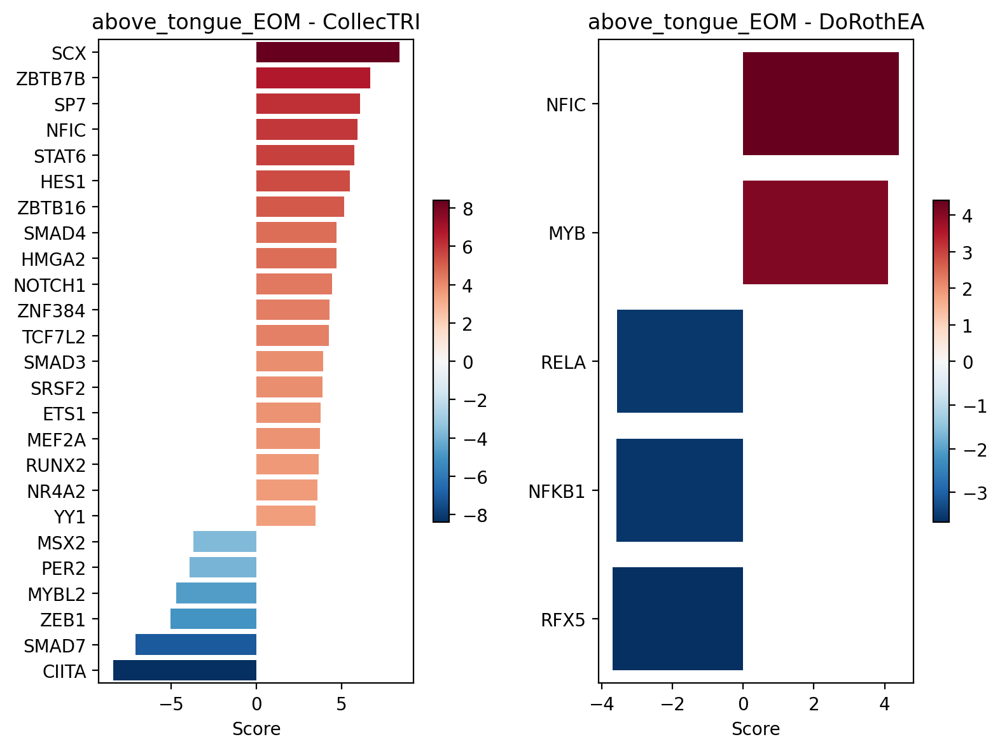

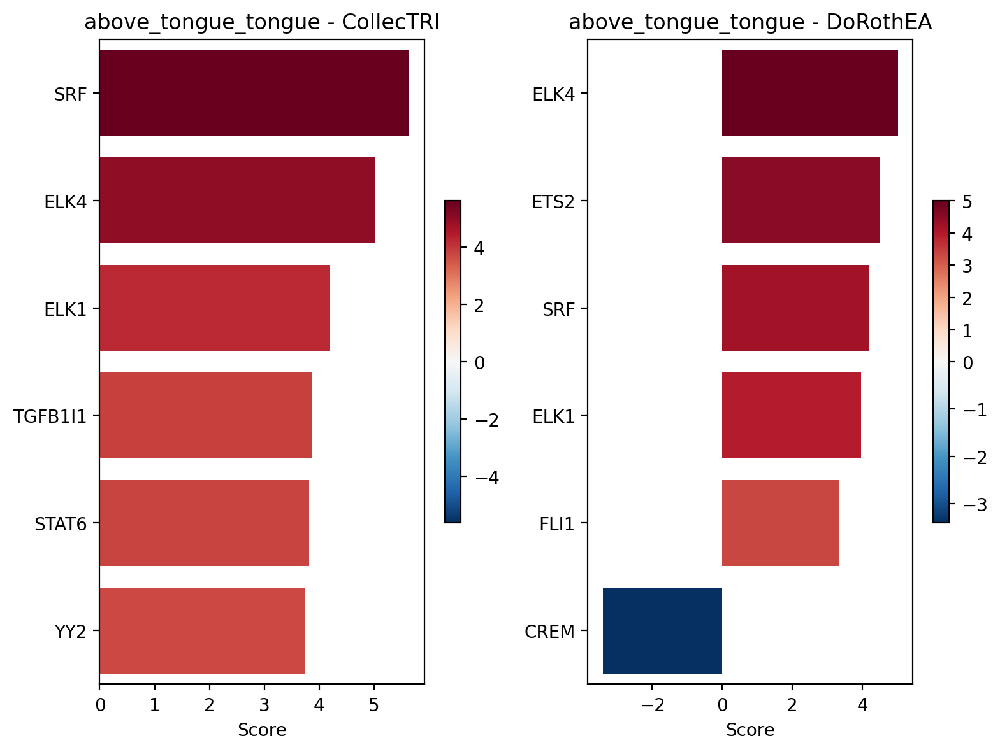

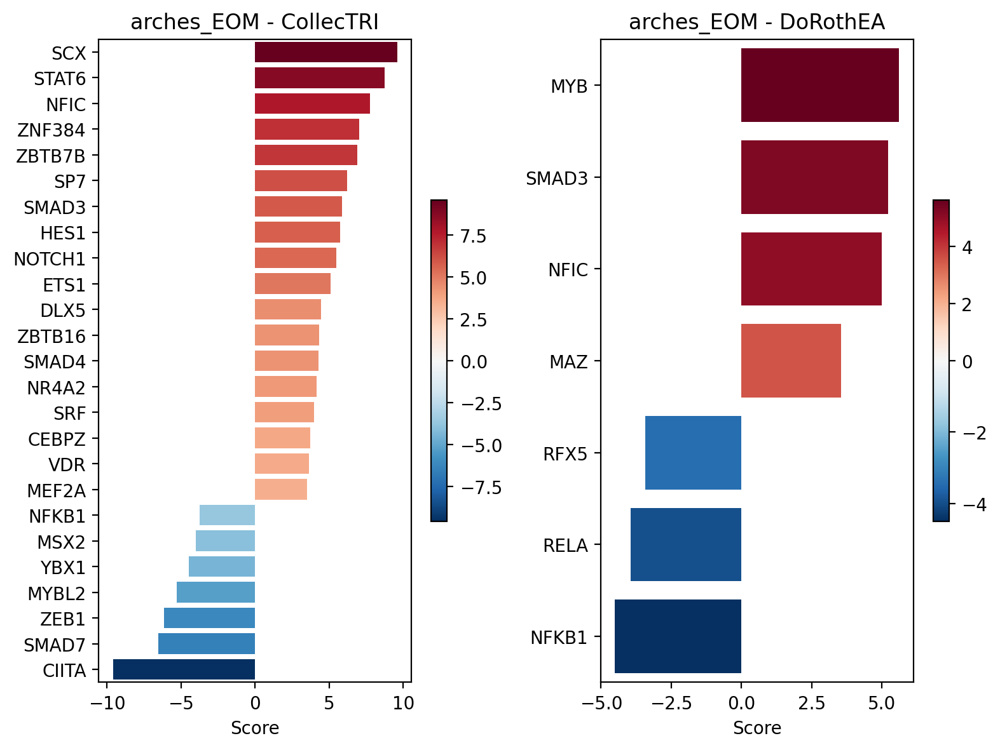

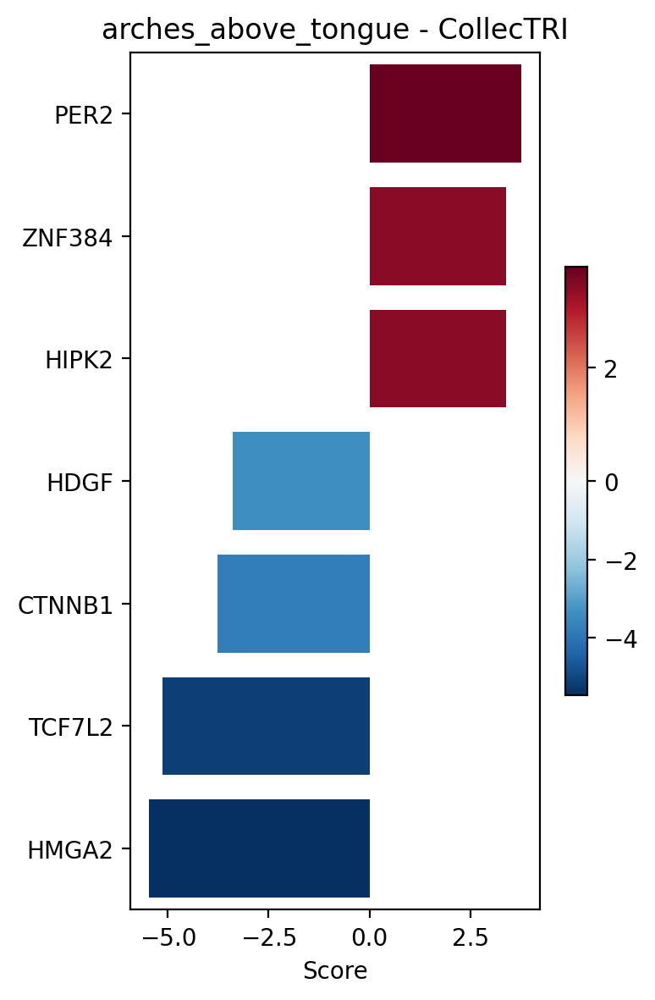

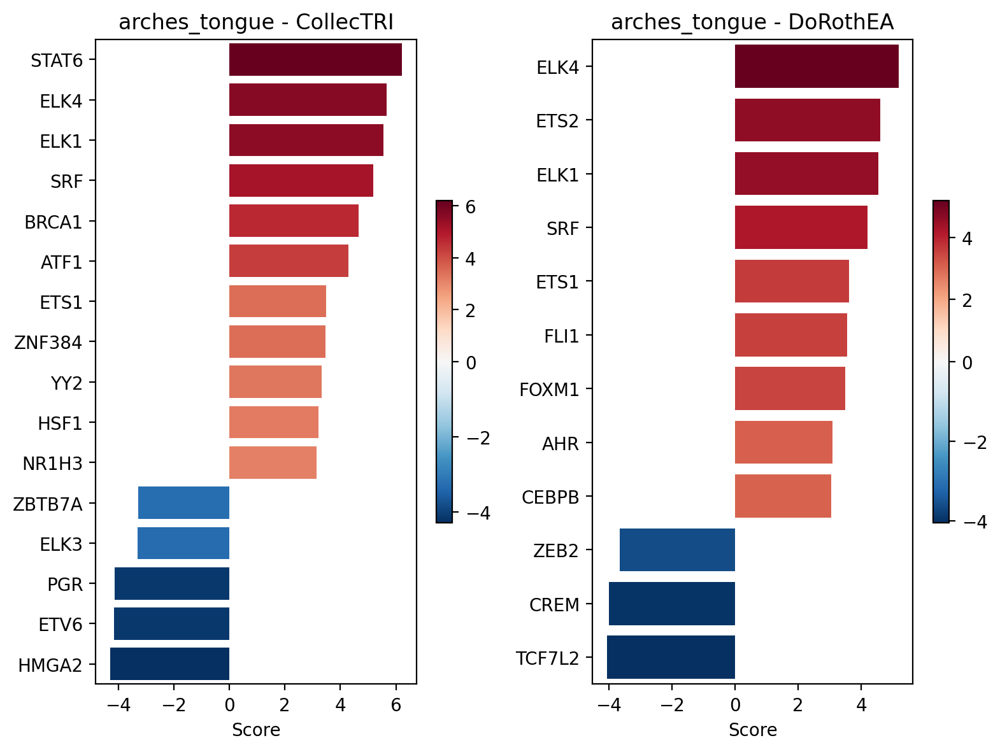

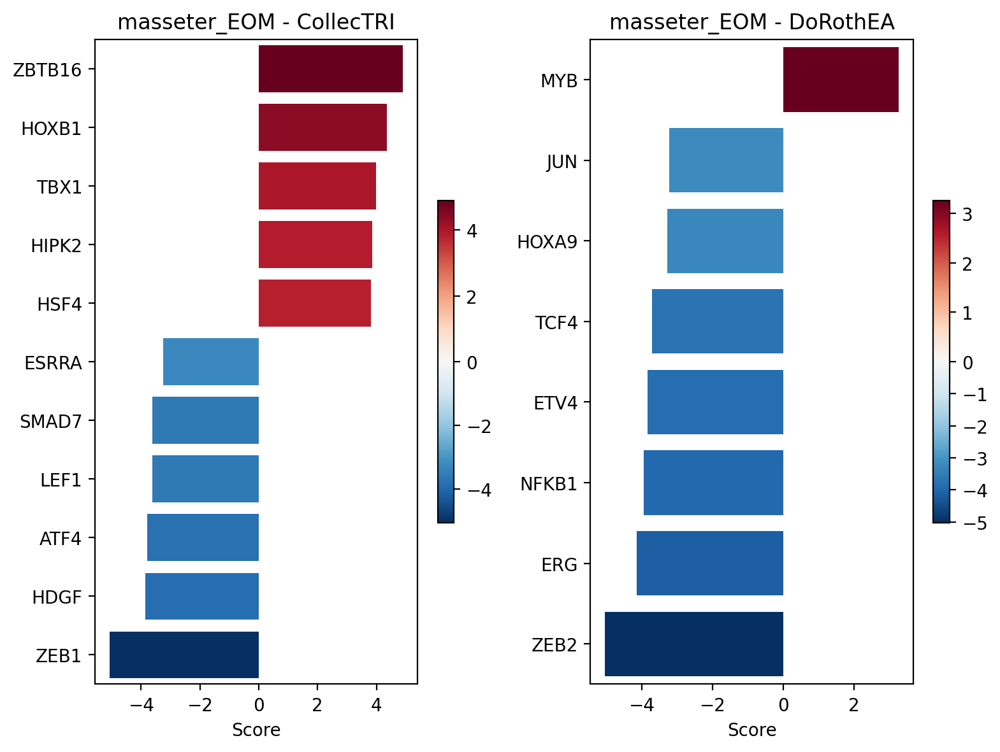

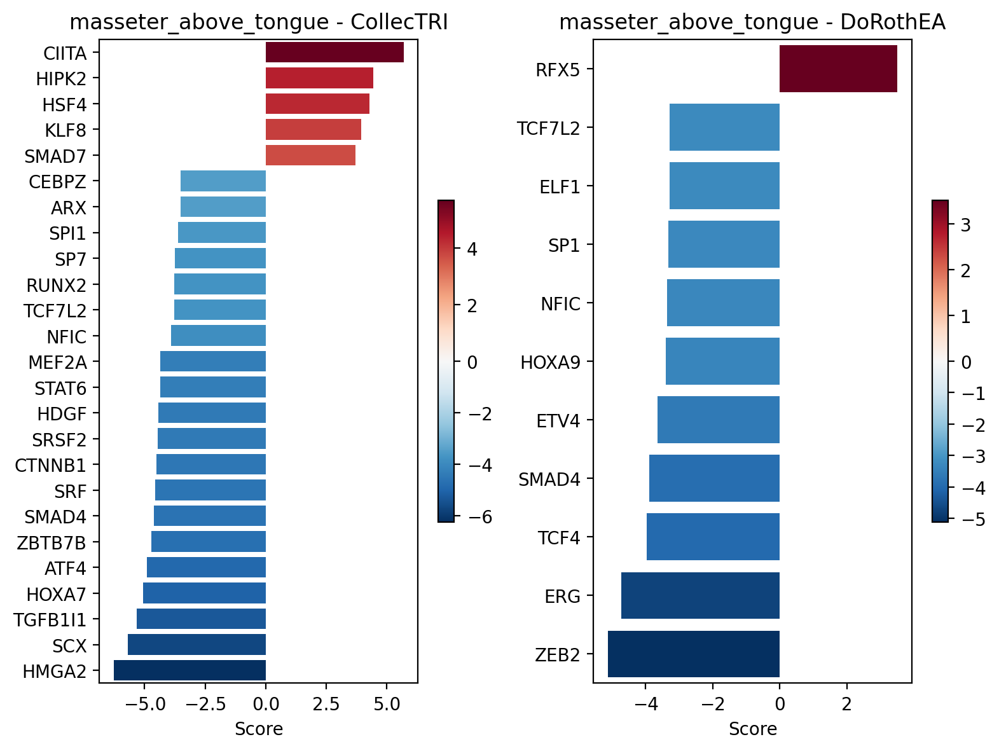

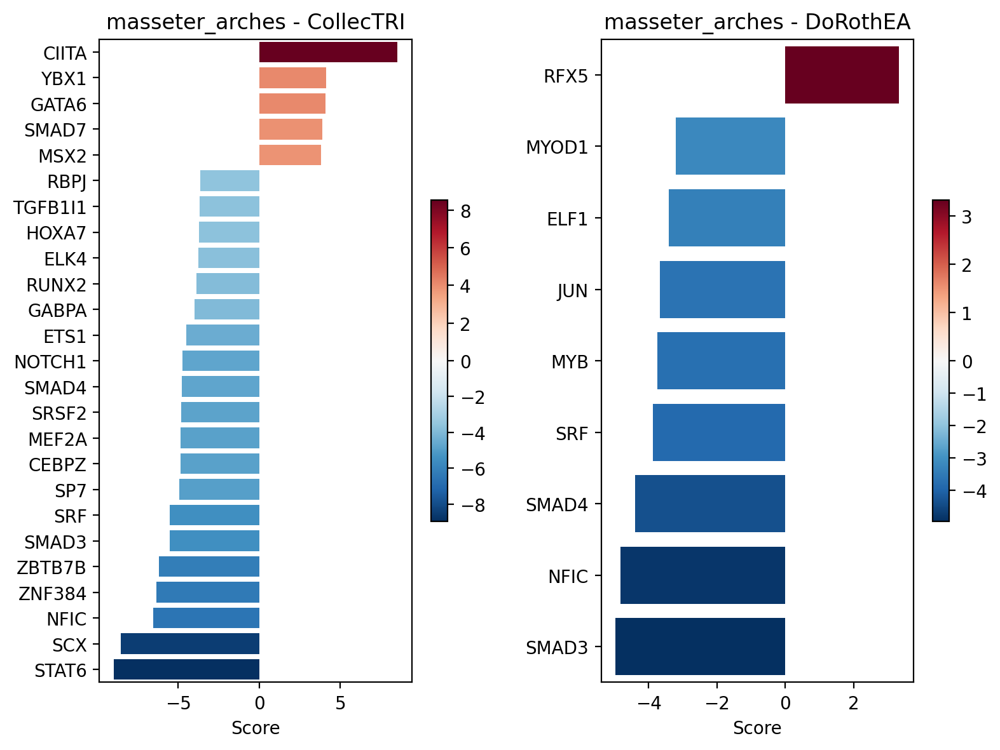

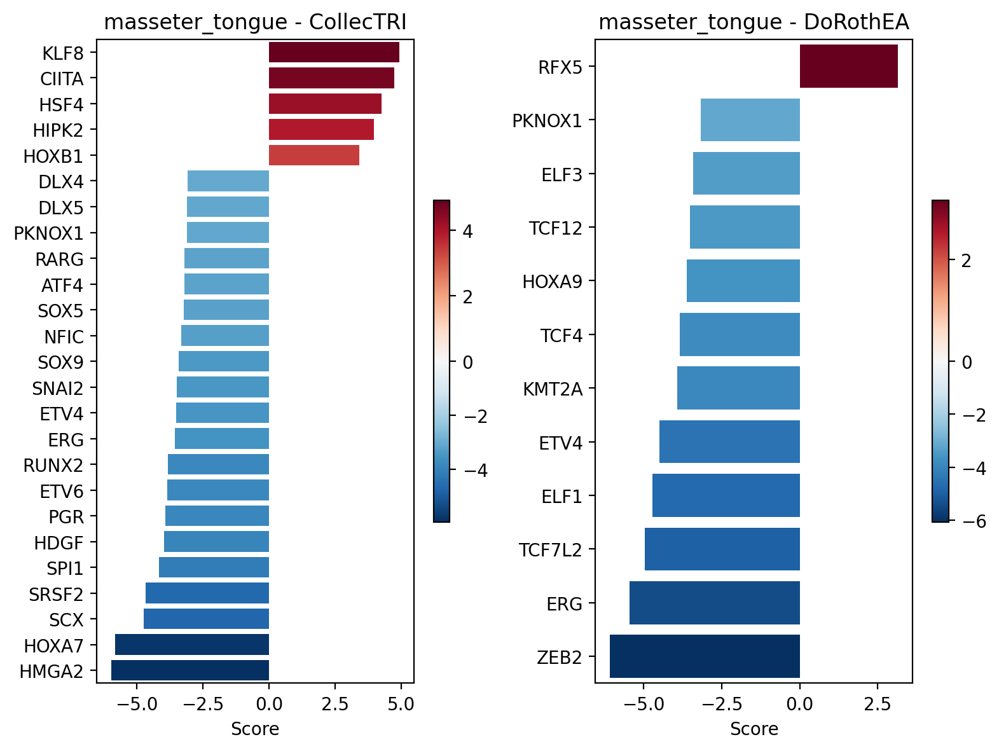

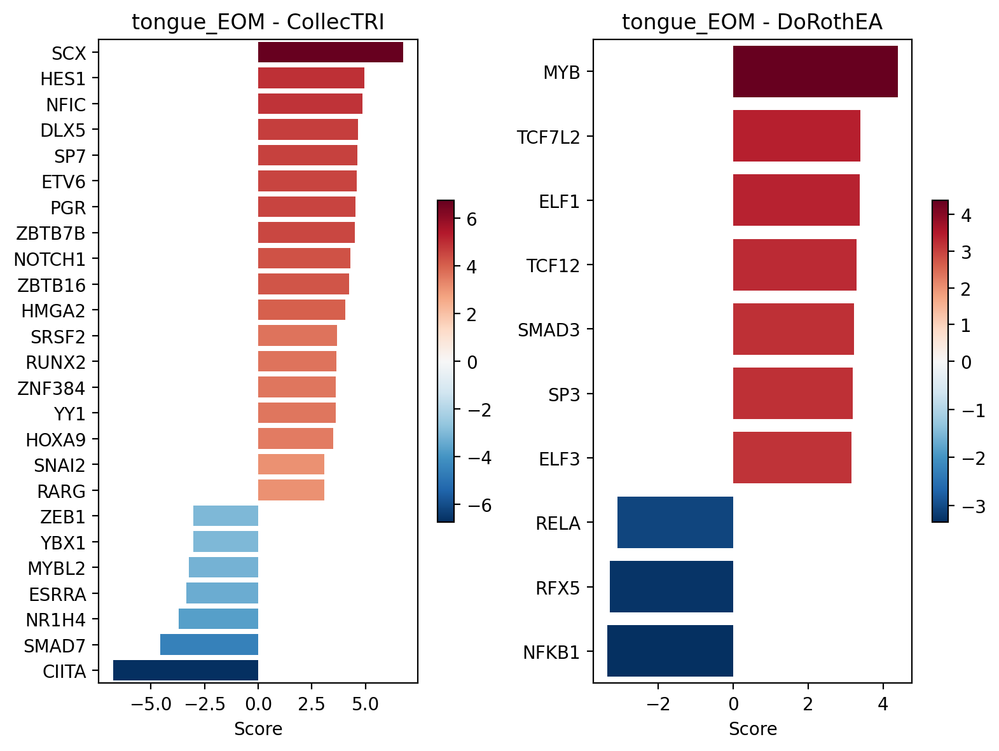

In [30]:
## Pseudobulk TF Enrichment Analysis ##
# Iterate over each muscle DEA results to find its associated enriched TF

# Load Databases
collectri = dc.op.collectri(organism="human")
dorothea = dc.op.dorothea(levels=['A', 'B', 'C'], organism="human")


TF_list_collectri = list()
TF_list_dorothea = list()

for comparison, df in data.items():
    tf_acts_collectri, tf_padj_collectri = dc.mt.ulm(data=df, net=collectri, tmin=2) 
    tf_acts_dorothea, tf_padj_dorothea = dc.mt.ulm(data=df, net=dorothea, tmin=2)
    
    # Print TF enrichment scores for significant adjusted p-values
    tf_acts_collectri = tf_acts_collectri.loc[:, (tf_padj_collectri.T < 0.05).iloc[:, 0]]
    tf_acts_dorothea = tf_acts_dorothea.loc[:, (tf_padj_dorothea.T < 0.05).iloc[:, 0]]

    
    TF_list_collectri.append(tf_acts_collectri.columns.to_list())
    TF_list_dorothea.append(tf_acts_dorothea.columns.to_list())
    
    # Check which networks have significant TFs
    has_collectri = not tf_acts_collectri.empty
    has_dorothea = not tf_acts_dorothea.empty
    
    if has_collectri or has_dorothea:
        # Determine number of subplots needed (1 or 2)
        n_plots = sum([has_collectri, has_dorothea])
        fig, axes = plt.subplots(1, n_plots, figsize=(4*n_plots, 6))
        
        # Handle single plot case (axes is not array)
        if n_plots == 1:
            axes = [axes]
        
        # Plot CollecTRI if available
        if has_collectri:
            ax_idx = 0 if has_collectri else 1
            dc.pl.barplot(data=tf_acts_collectri, name=f"{comparison}", figsize=(3, 6), ax=axes[ax_idx])
            axes[ax_idx].set_title(f"{comparison} - CollecTRI", fontsize=12)
        
        # Plot DoRothEA if available  
        if has_dorothea:
            ax_idx = 1 if has_collectri else 0
            dc.pl.barplot(data=tf_acts_dorothea, name=f"{comparison}", figsize=(3, 6), ax=axes[ax_idx])
            axes[ax_idx].set_title(f"{comparison} - DoRothEA", fontsize=12)
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"No significant TFs found for {comparison} - skipping plot")

#### Heatmaps of enriched TFs

Most enriched TF aren't found in our data, which makes sense as what matters is rather the expression of their target genes.

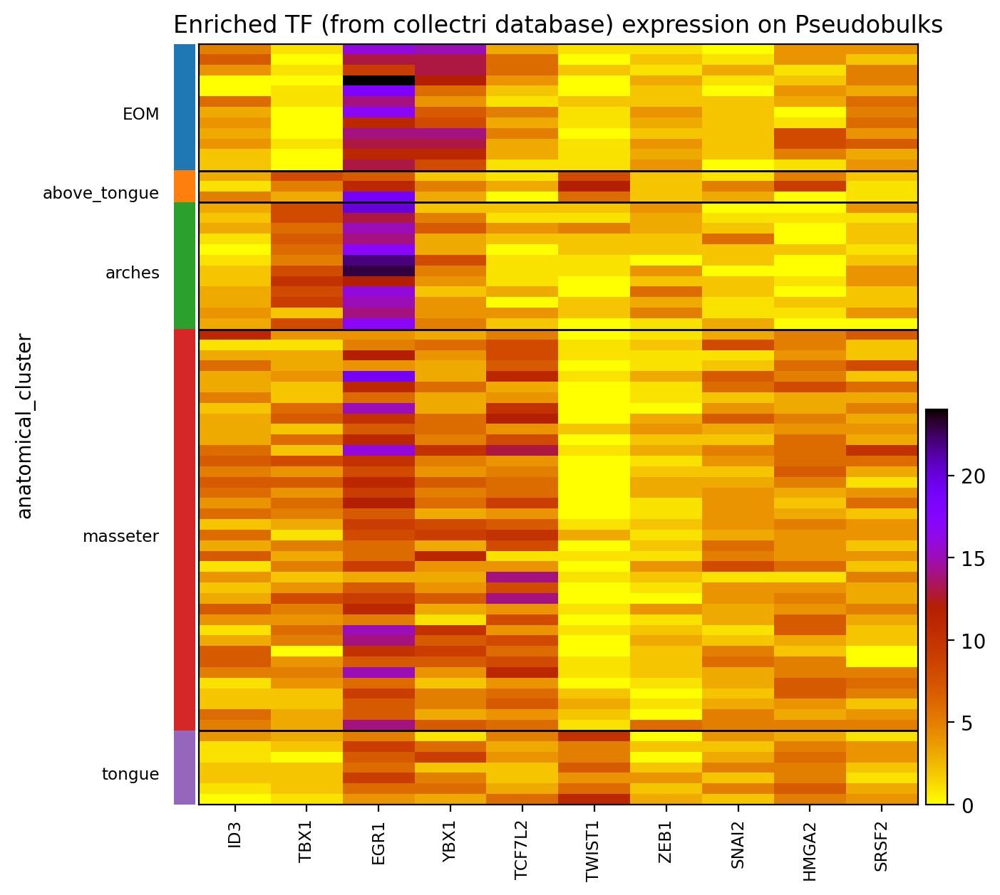

The following enriched TFs, of database collectri, are not expressed in our data: ['TFE3', 'MEF2A', 'SMAD7', 'MSX2', 'ELF1', 'DLX5', 'TGFB1I1', 'CTNNB1', 'HOXD13', 'KLF17', 'MYB', 'SP7', 'VDR', 'RUNX2', 'NFKB1', 'PGR', 'HOXA9', 'KLF8', 'ERG', 'NFYC', 'HDGF', 'RARG', 'GATA6', 'ELK1', 'ZBTB7A', 'SMAD4', 'SMAD1', 'NOTCH1', 'HMGA1', 'ZBTB16', 'HSF4', 'ELK3', 'SCX', 'NR4A2', 'MYBL2', 'BRCA1', 'STAT6', 'AP1', 'YY1', 'ATF1', 'DOT1L', 'NFIC', 'CIITA', 'TBX2', 'DLX4', 'HIPK2', 'ELK4', 'YY2', 'PROX1', 'EP300', 'SMAD3', 'RFX5', 'SOX9', 'FOXC1', 'ETV4', 'SOX5', 'ZNF384', 'ATF4', 'SP1', 'HES1', 'RBPJ', 'JUNB', 'NR1H4', 'GABPA', 'HOXB1', 'ARX', 'ETS1', 'PKNOX1', 'CEBPZ', 'GLI1', 'SPI1', 'HOXA7', 'ZBTB7B', 'ETV6', 'USF1', 'HSF1', 'PER2', 'SRF', 'NR1H3', 'LEF1', 'CEBPD', 'ESRRA']


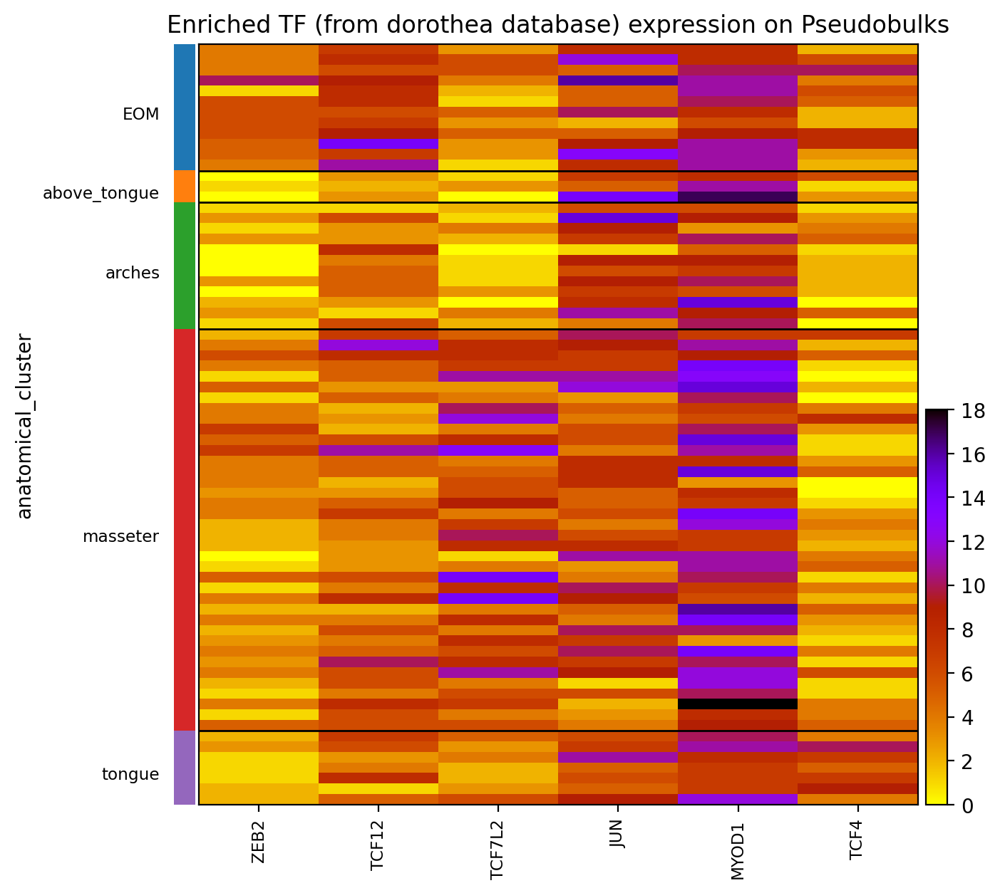

The following enriched TFs, of database dorothea, are not expressed in our data: ['ELF1', 'SMAD3', 'RFX5', 'MYB', 'ETV4', 'NFKB1', 'SP1', 'CEBPB', 'RELA', 'HOXA9', 'MAZ', 'ERG', 'CREM', 'ELK1', 'ETS1', 'PKNOX1', 'KMT2A', 'FLI1', 'SMAD4', 'FOXM1', 'AHR', 'ETS2', 'SRF', 'NFIC', 'SP3', 'ELK4', 'ELF3']


In [31]:
# TF_list is a list of list, flatten it
def flatten(xss):
    return [x for xs in xss for x in xs]

# Get TF expressed in our data
TF_collectri = list(set(flatten(TF_list_collectri)))
present_TF_collectri=[TF for TF in TF_collectri if TF in pdata_muscle.var.index]
not_present_TF_collectri=list(set(TF_collectri) - set(present_TF_collectri))

TF_dorothea = list(set(flatten(TF_list_dorothea)))
present_TF_dorothea=[TF for TF in TF_dorothea if TF in pdata_muscle.var.index]
not_present_TF_dorothea=list(set(TF_dorothea) - set(present_TF_dorothea))



# Heatmap of expression 
# Check how the reported enriched TF are expressed across clusters, on the heatmap

heatmap_1=sc.pl.heatmap(
    adata=pdata_muscle,
    use_raw = False,
    groupby="anatomical_cluster",
    var_names=present_TF_collectri,
    cmap="gnuplot_r",
    figsize=(7,7), 
    show=False
)
heatmap_1["heatmap_ax"].set_title("Enriched TF (from collectri database) expression on Pseudobulks")
plt.show()

print(f"The following enriched TFs, of database collectri, are not expressed in our data: {not_present_TF_collectri}")


heatmap_2=sc.pl.heatmap(
    adata=pdata_muscle,
    use_raw = False,
    groupby="anatomical_cluster",
    var_names=present_TF_dorothea,
    cmap="gnuplot_r",
    figsize=(7,7),
    show=False
)
heatmap_2["heatmap_ax"].set_title("Enriched TF (from dorothea database) expression on Pseudobulks")
plt.show()
print(f"The following enriched TFs, of database dorothea, are not expressed in our data: {not_present_TF_dorothea}")


# Differential Expression Analysis - Heatmaps and Dotplots

In [32]:
#### Aggregate several TF databases, to label in gold TF in DEA dotplots ####
collectri = dc.op.collectri(organism="human")
dorothea = dc.op.dorothea(levels=['A', 'B', 'C', 'D'], organism="human")

db_1 = collectri['source'].to_list()
db_2 = dorothea['source'].to_list()
db = db_1 + db_2
TF_genes = list(set(db))


In [33]:
#### Aggregate several TF databases, to label in gold TF in DEA dotplots ####
collectri = dc.op.collectri(organism="human")
dorothea = dc.op.dorothea(levels=['A', 'B', 'C', 'D'], organism="human")

db_1 = collectri['source'].to_list()
db_2 = dorothea['source'].to_list()
db = db_1 + db_2
TF_genes = list(set(db))


**Pseudobulk DEA - Pairwise Comparisons**

DEA was done in DEA_DESeq2.ipynb. Results are stored in DEA_results/. We just plot here.

**Data Loading**

In [34]:
######### Load DEA results ########
## (logFC shrink and filtered based on adjusted p-value, generated in DEA_DESeq2.ipynb) 

## Load DEA results 
directory = f"/pasteur/helix/projects/fast_npz/Naomie/Shahragim_Project/visium_HD/spatial_EOM/segmentation/StarDist/Pseudobulk_Analysis/DEA_results/Pseudobulks_{CELLS_PER_PSEUDOBULK}cells/{NGENES}Genes/"
tsv_files = glob.glob(os.path.join(directory, "*_shrink.tsv"))

data_shrink = {}

for file_path in tsv_files:

    filename = os.path.basename(file_path)
    basename = os.path.splitext(filename)[0]  
     
    df_name = f"data_{basename.replace('_shrink','')}"
    
    df = pd.read_csv(file_path, sep="\t", index_col=0)
        
    # Store dataframes in dictionary
    dict_key = basename.replace('_shrink','')
    data_shrink[dict_key] = df

# what was loaded: 
#list(data_shrink.keys())

In [35]:
## Load top markers
data_top_markers = {}
tsv_files = glob.glob(os.path.join(directory, "*_top_markers.tsv"))

for file_path in tsv_files:

    filename = os.path.basename(file_path)
    basename = os.path.splitext(filename)[0]  
     
    df_name = f"data_{basename.replace('_top_markers','')}"
    
    df = pd.read_csv(file_path, sep="\t", index_col=0)
        
    # Store dataframes in dictionary
    dict_key = basename.replace('_top_markers','')
    data_top_markers[dict_key] = df

#list(data_top_markers.keys())

### Dotplots - all genes reported as upregulated

In [49]:
## dotplots - all upregulated genes ##

# Number of rows = number of comparisons in data_shrink
num_rows = len(data_shrink)  

height_ratios = []

# Parse groups and calculate max genes for each comparison for height scaling
parsed_comparisons = []  # To store parsed tuples (comparison, group1, group2, df, etc)
for comparison, df in data_shrink.items():

    # Comparison names have structure group1_vs_group2
    parts = comparison.split("_") 
    if len(parts) == 2:
        group1, group2 = parts
    else:
        if "above_tongue" in comparison:
            if parts[0] == "above":
                group1 = "above_tongue"
                group2 = parts[2]
            elif parts[1] == "above":
                group1 = parts[0]
                group2 = "above_tongue"
            else:
                raise ValueError(f"Unexpected comparison format: {comparison}")
        else:
            raise ValueError(f"Unexpected comparison format: {comparison}")

    df_up_group1 = df[df['log2FoldChange'] > 0]
    df_up_group2 = df[df['log2FoldChange'] < 0]

    count1 = len(df_up_group1.index) if not df_up_group1.empty else 1
    count2 = len(df_up_group2.index) if not df_up_group2.empty else 1
    
    height_ratios.append(max(count1, count2))
    
    parsed_comparisons.append( (comparison, group1, group2, df_up_group1, df_up_group2) )

# Define figure height: scale factor 0.5 inch per gene (adjust as you like)
fig_height = sum(height_ratios) * 0.4
fig = plt.figure(figsize=(15, fig_height))

# Create GridSpec with height ratios proportional to max genes in each comparison row
gs = gridspec.GridSpec(num_rows, 2, height_ratios=height_ratios)

for i, (comparison, group1, group2, df_up_group1, df_up_group2) in enumerate(parsed_comparisons):

    ax1 = fig.add_subplot(gs[i, 0])
    ax2 = fig.add_subplot(gs[i, 1])

    # Plot genes upregulated in group1 versus group2
    if not df_up_group1.empty:
        dotplot_1 = sc.pl.dotplot(pdata_muscle, var_names=df_up_group1.index, groupby='anatomical_cluster',
                      show=False, swap_axes=True, ax=ax1)
        ax1 = dotplot_1["mainplot_ax"]
        ax1.set_title(f"Genes upregulated in {group1} compared to {group2}", fontsize=12, pad=5)

        # Label TFs in gold
        for label in ax1.get_yticklabels():
            label.set_style("italic")
            gene = label.get_text()
            if gene in TF_genes:
                label.set_color("#A97F03")
                label.set_fontweight("bold")
            else:
                label.set_color("black")
                label.set_fontweight("normal")
    else:
        ax1.text(0.5, 0.5, f"No gene upregulated in condition {group1} \nof comparison {comparison}", 
                 ha='center', va='center', transform=ax1.transAxes,
                 fontsize=12, style='italic')
        ax1.set_axis_off()
    
    # Plot genes upregulated in group2 versus group1
    if not df_up_group2.empty:
        dotplot_2 = sc.pl.dotplot(pdata_muscle, var_names=df_up_group2.index, groupby='anatomical_cluster',
                      show=False, swap_axes=True, ax=ax2)
        ax2 = dotplot_2["mainplot_ax"]
        ax2.set_title(f"Genes upregulated in {group2} compared to {group1}", fontsize=12, pad=5)
        
        # Label TFs in gold
        for label in ax2.get_yticklabels():
            label.set_style("italic")
            gene = label.get_text()
            if gene in TF_genes:
                label.set_color("#A97F03")
                label.set_fontweight("bold")
            else:
                label.set_color("black")
                label.set_fontweight("normal")
                
    else:
        ax2.text(0.5, 0.5, f"No gene upregulated in condition {group2} \nof comparison {comparison}", 
                 ha='center', va='center', transform=ax2.transAxes,
                 fontsize=12, style='italic')
        ax2.set_axis_off()

#plt.tight_layout()
plt.show()

### Dotplots - genes upregulated in more than 1/2 comparisons involving a cluster

Eg genes reported as upregulated in half of comparisons involving EOM arches vs. EOM , above tongue vs. EOM , tongue vs. EOM , masseter vs. EOM

1705449793.py (20): This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


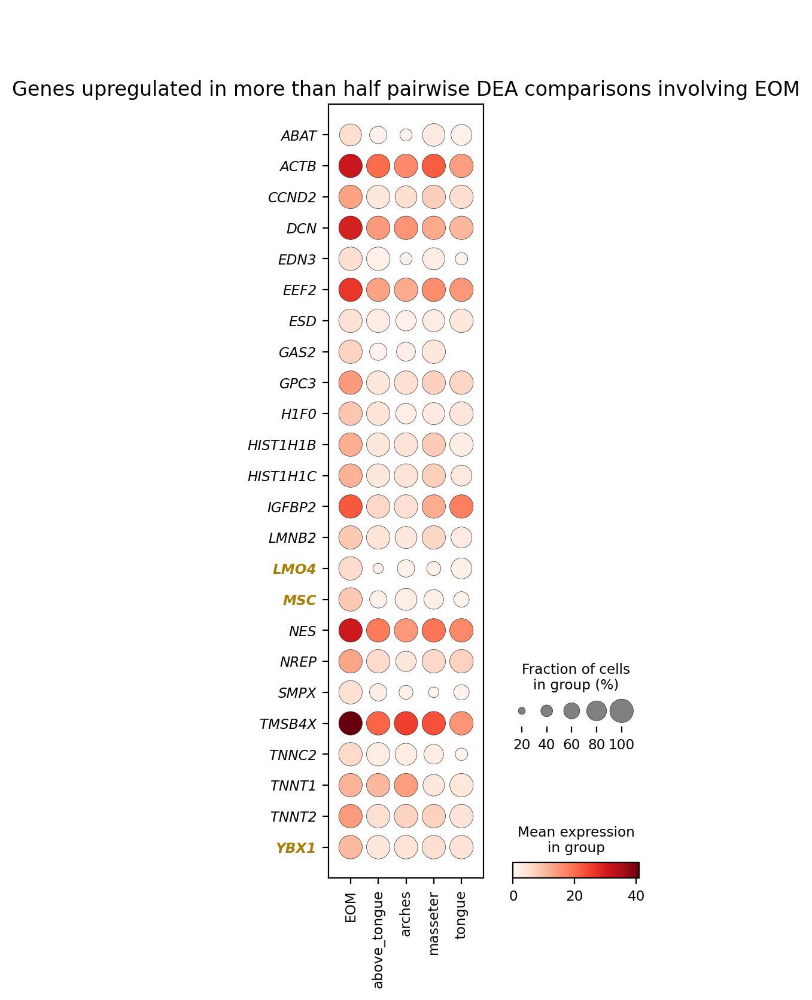

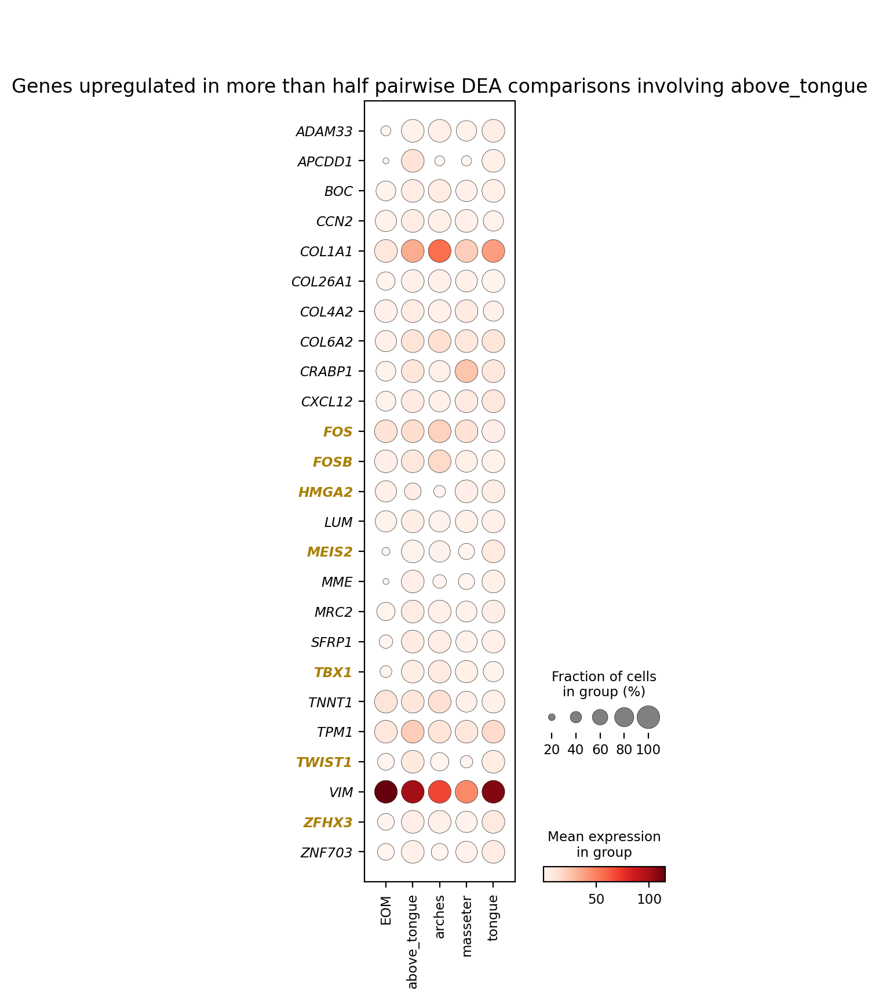

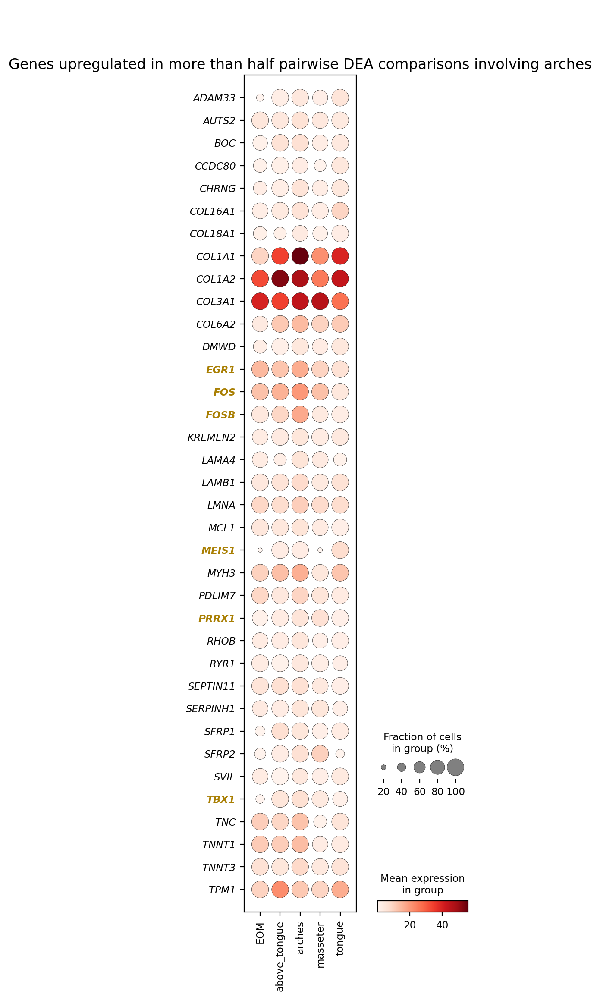

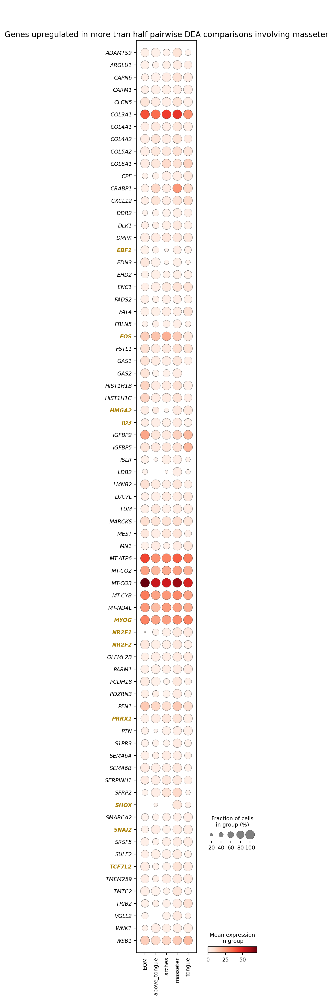

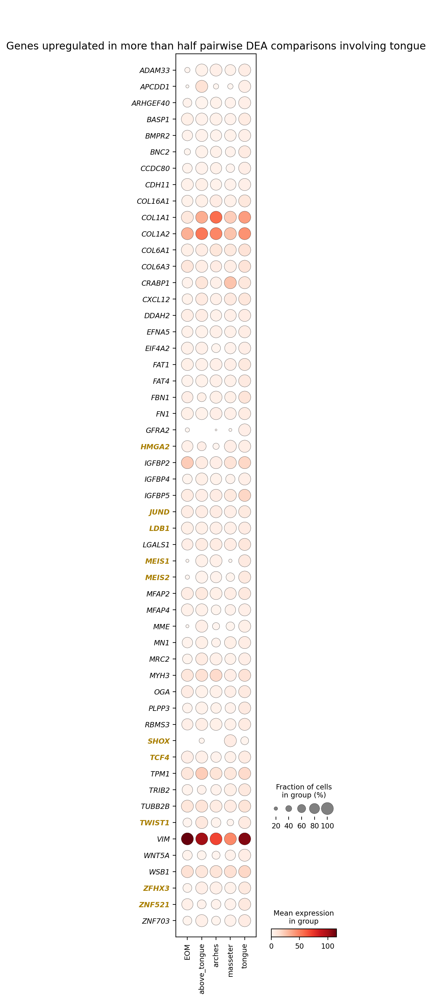

In [37]:
for cluster, top_markers_df in data_top_markers.items():
    genes=top_markers_df['gene'].values.tolist()
    dotplot = sc.pl.dotplot(pdata_muscle, var_names=genes, groupby='anatomical_cluster',
                              show=False, swap_axes=True)
    ax = dotplot["mainplot_ax"]
    ax.set_title(f"Genes upregulated in more than half pairwise DEA comparisons involving {cluster}", fontsize=12, pad=5)

    # Label TFs in gold
    for label in ax.get_yticklabels():
        label.set_style("italic")
        gene = label.get_text()
        if gene in TF_genes:
            label.set_color("#A97F03")
            label.set_fontweight("bold")
        else:
            label.set_color("black")
            label.set_fontweight("normal")


plt.tight_layout()
plt.show()

### Heatmaps - top 50 upregulated genes

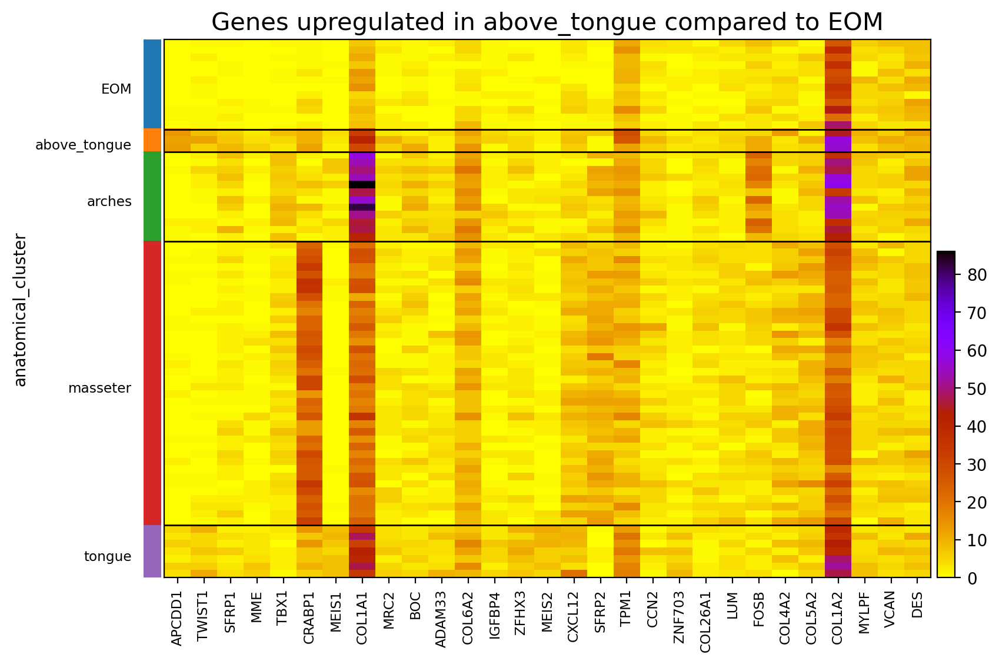

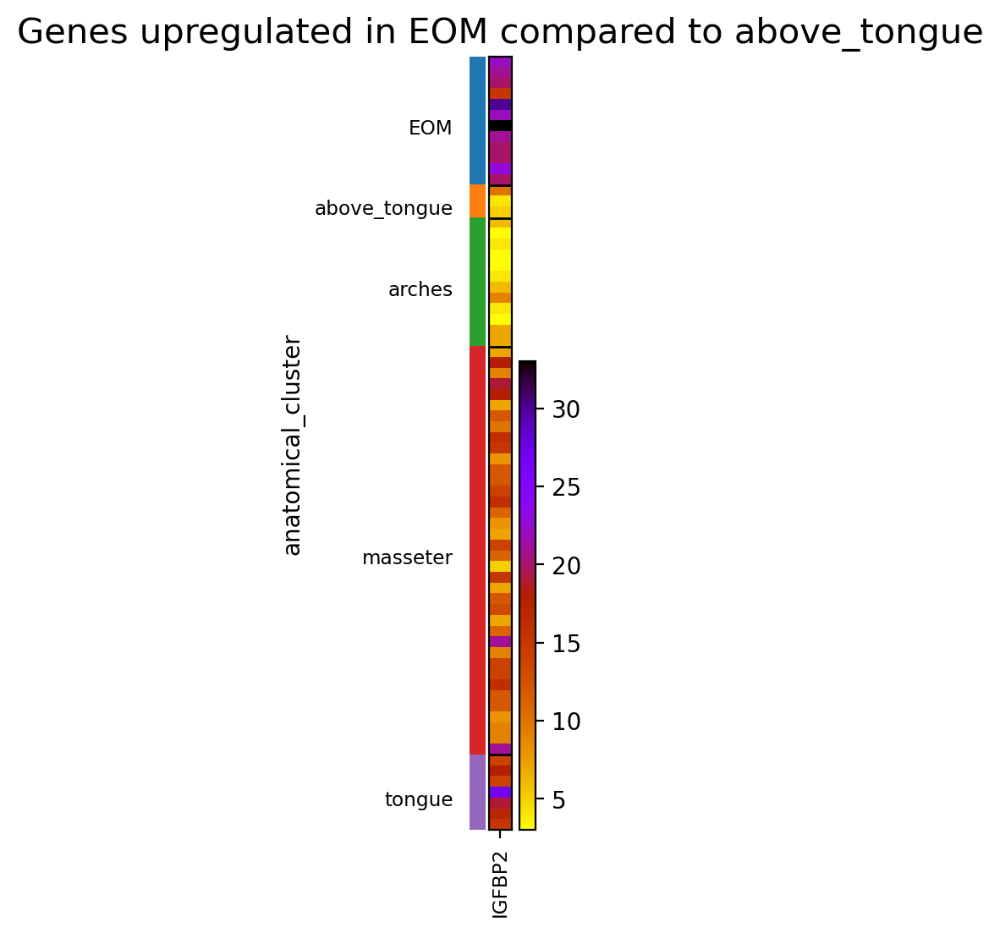

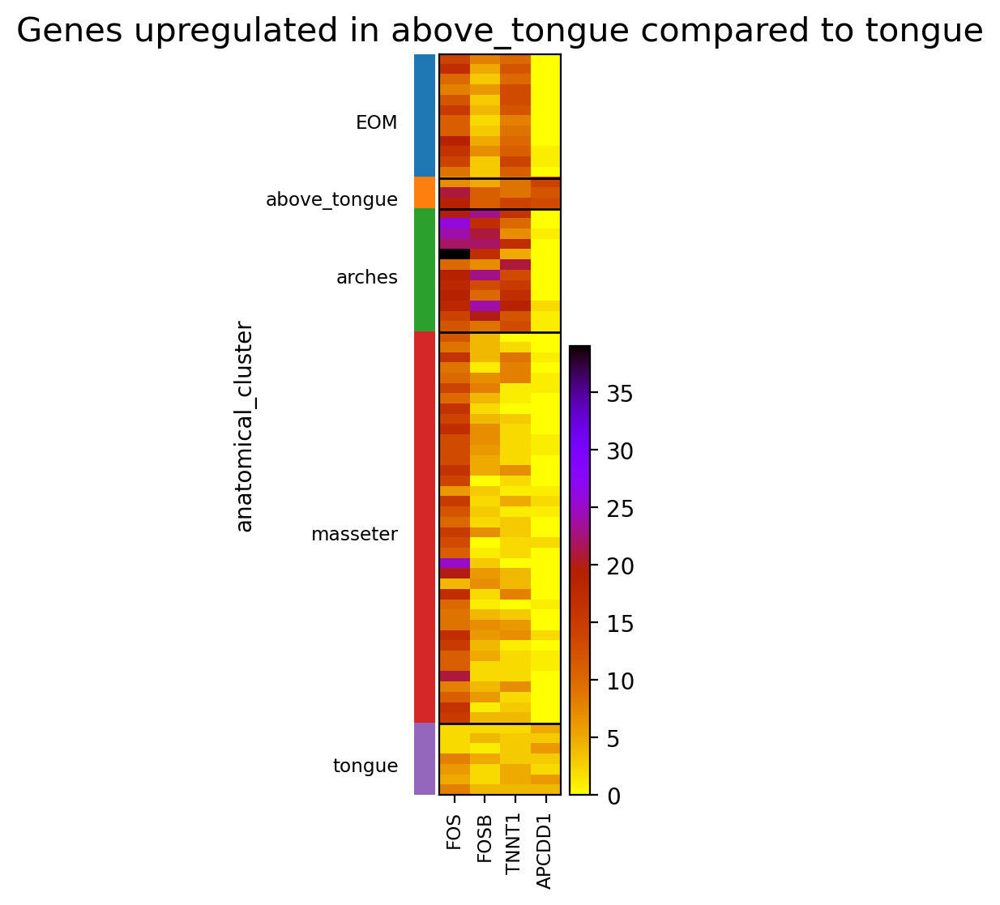

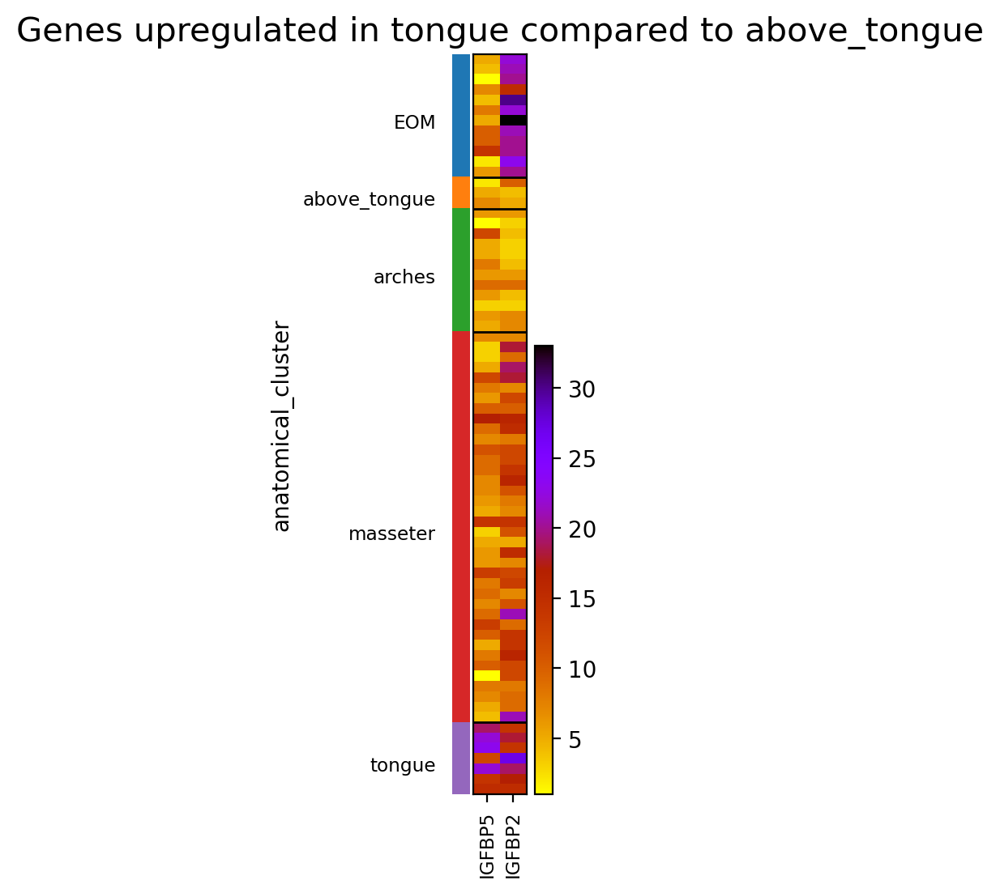

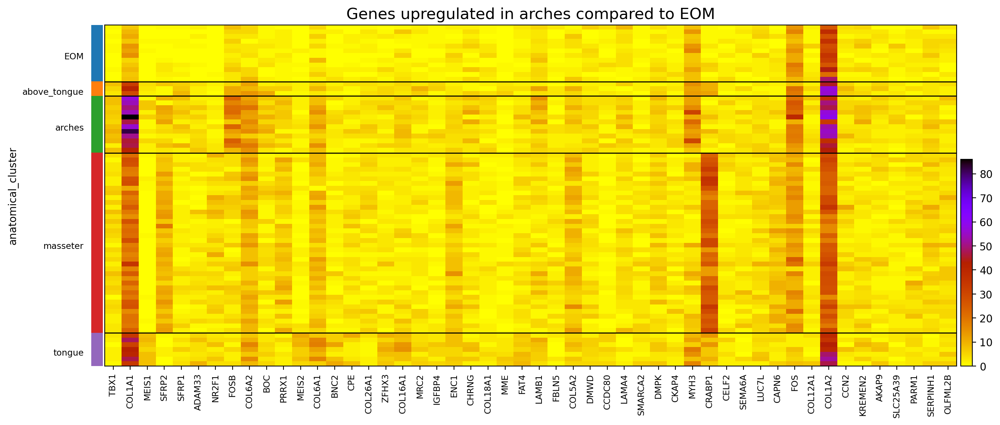

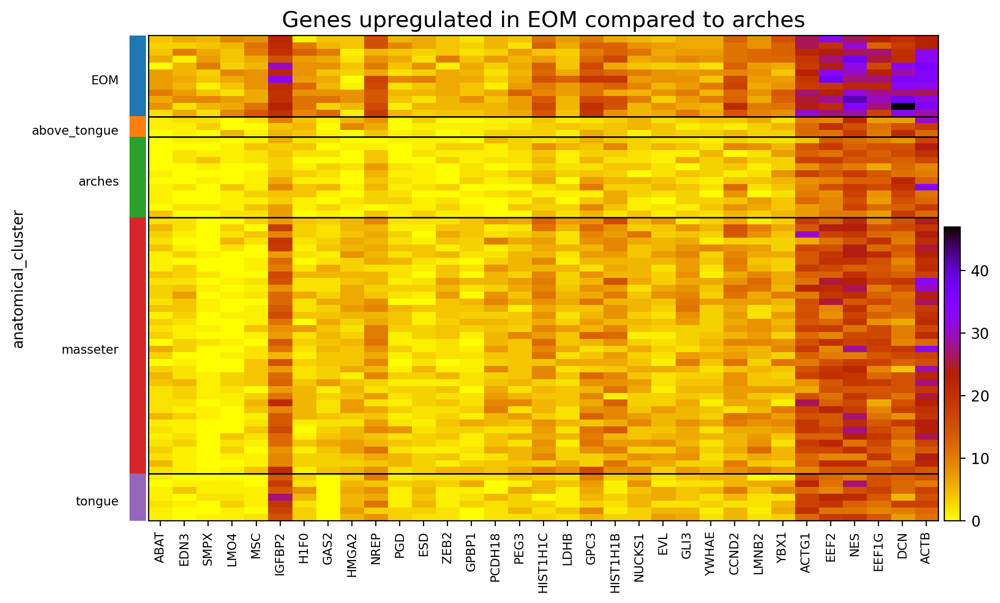

No gene upregulated in arches compared to above_tongue


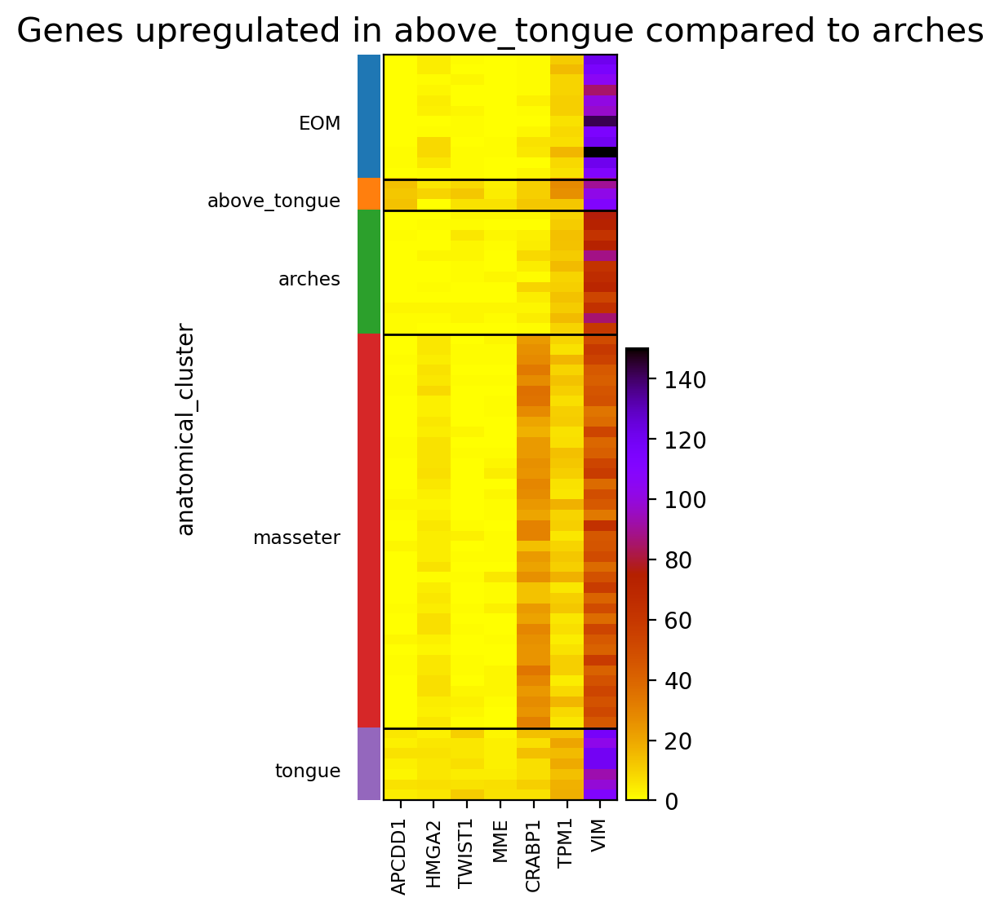

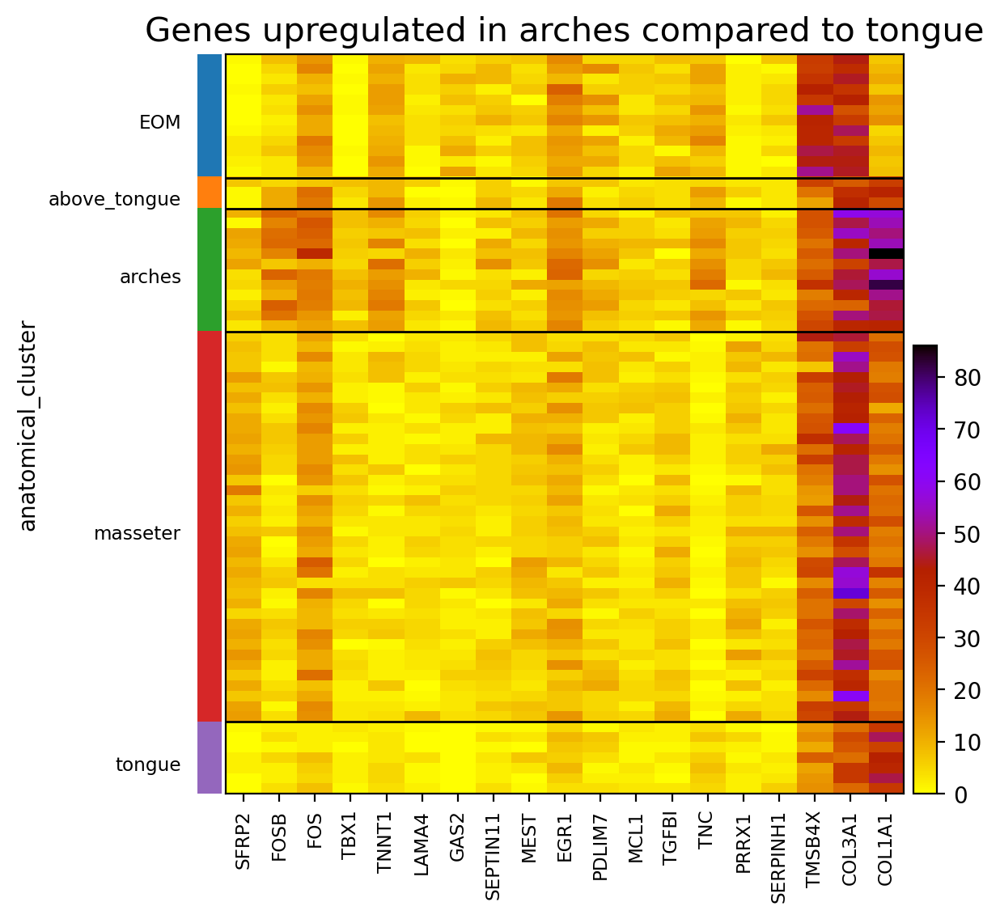

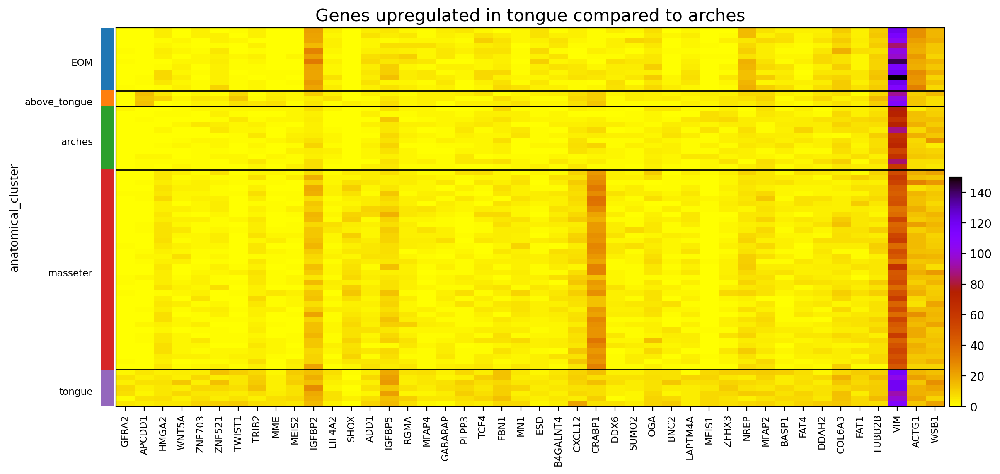

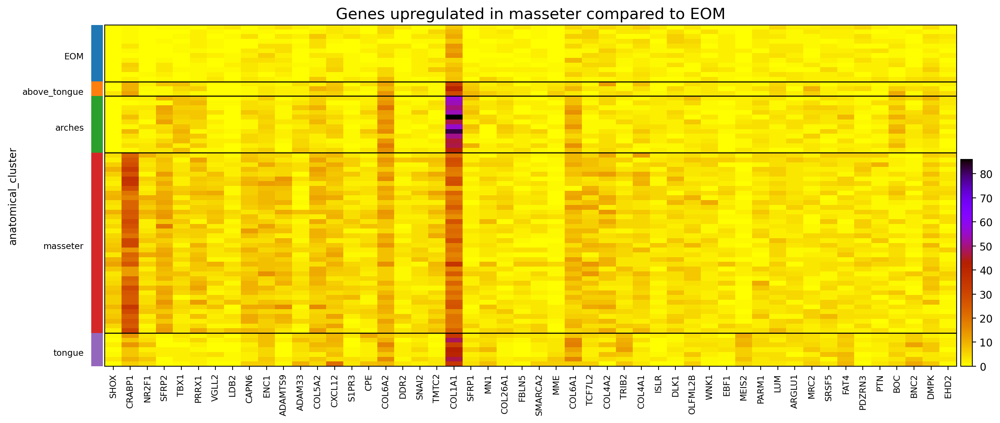

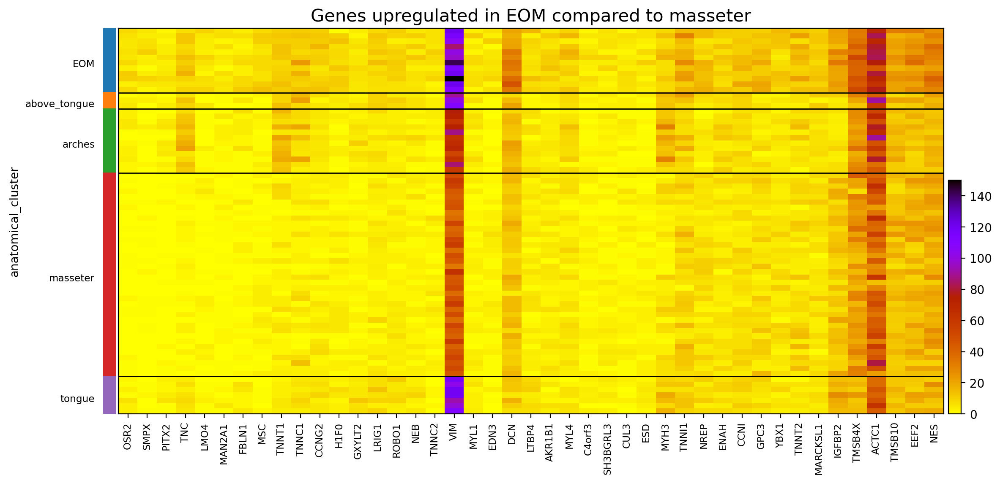

...

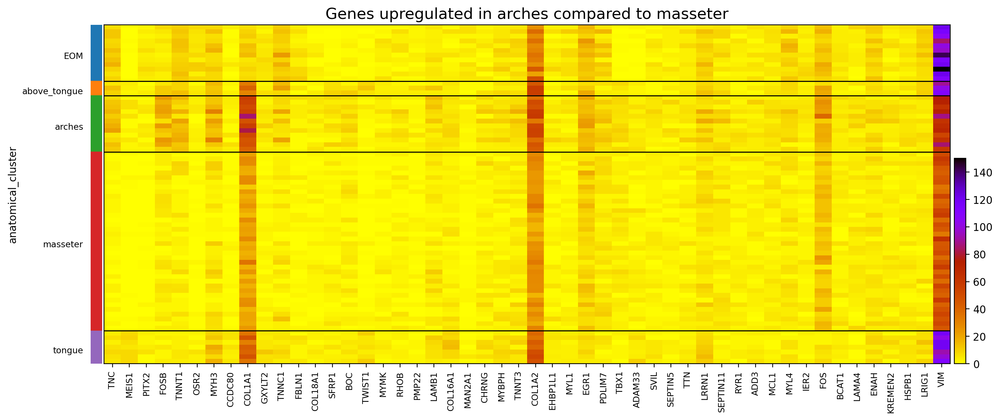

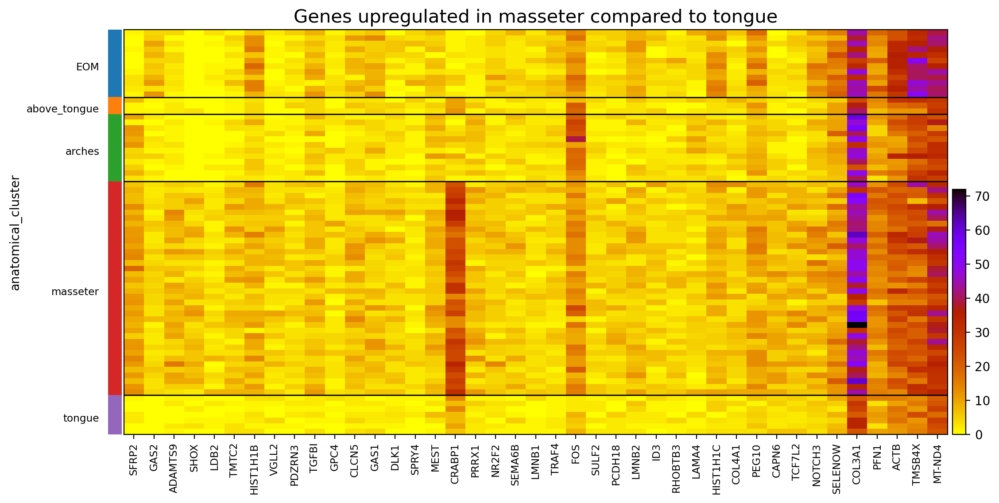

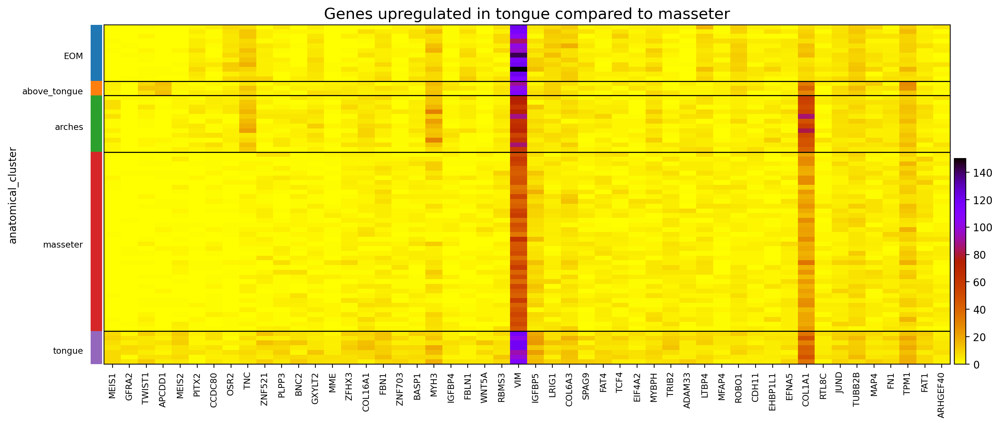

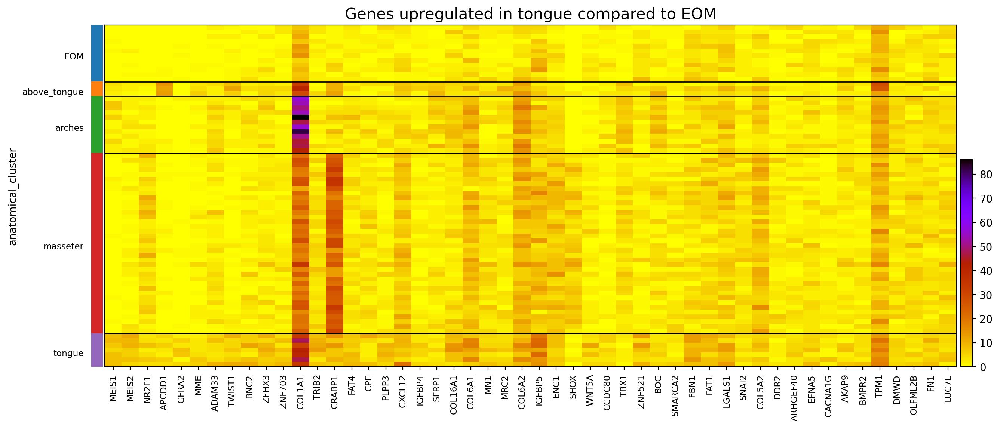

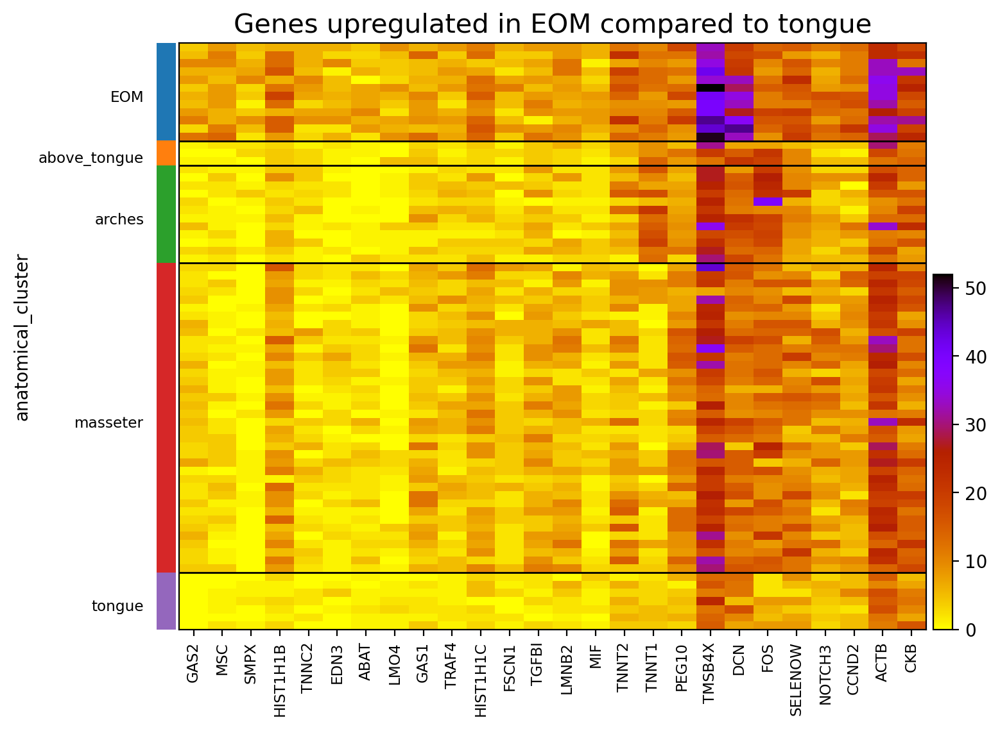

In [38]:
## heatmaps 50 top upregualted genes ##

# Number of rows = number of comparisons in data_shrink
num_rows = len(data_shrink)  


parsed_comparisons = []  # To store parsed tuples (comparison, group1, group2, df, etc)
for comparison, df in data_shrink.items():

    # Comparison names have structure group1_vs_group2
    parts = comparison.split("_") 
    if len(parts) == 2:
        group1, group2 = parts
    else:
        if "above_tongue" in comparison:
            if parts[0] == "above":
                group1 = "above_tongue"
                group2 = parts[2]
            elif parts[1] == "above":
                group1 = parts[0]
                group2 = "above_tongue"
            else:
                raise ValueError(f"Unexpected comparison format: {comparison}")
        else:
            raise ValueError(f"Unexpected comparison format: {comparison}")

    # Genes upreg in group1
    df_up_group1 = df[df['log2FoldChange'] > 0]
    df_up_group1=df_up_group1.sort_values(by='log2FoldChange', ascending=False)
    genes = df_up_group1.index
    # Select X top for plotting concerns
    top_genes_group1=genes[:50]

    # Genes upreg in group2
    df_up_group2 = df[df['log2FoldChange'] < 0]
    df_up_group2=df_up_group2.sort_values(by='log2FoldChange', ascending=True)
    genes = df_up_group2.index
    top_genes_group2=genes[:50]



    # Plot genes upregulated in group1 versus group2
    if not df_up_group1.empty:
        heatmap_1=sc.pl.heatmap(
            adata=pdata_muscle,
            groupby="anatomical_cluster",
            var_names=top_genes_group1,
            cmap="gnuplot_r", show=False)
        heatmap_1["heatmap_ax"].set_title(f"Genes upregulated in {group1} compared to {group2}", fontsize=15)
        plt.show()
    else:
        print(f"No gene upregulated in {group1} compared to {group2}")

    
    # Plot genes upregulated in group2 versus group1
    if not df_up_group2.empty:
        heatmap_2=sc.pl.heatmap(
            adata=pdata_muscle,
            groupby="anatomical_cluster",
            var_names=top_genes_group2,
            cmap="gnuplot_r", show=False)
        heatmap_2["heatmap_ax"].set_title(f"Genes upregulated in {group2} compared to {group1}", fontsize=15)
        plt.show()
    else:
        print(f"No gene upregulated in {group2} compared to {group1}")


### Heatmaps - genes upregulated in more than 1/2 comparisons involving a cluster

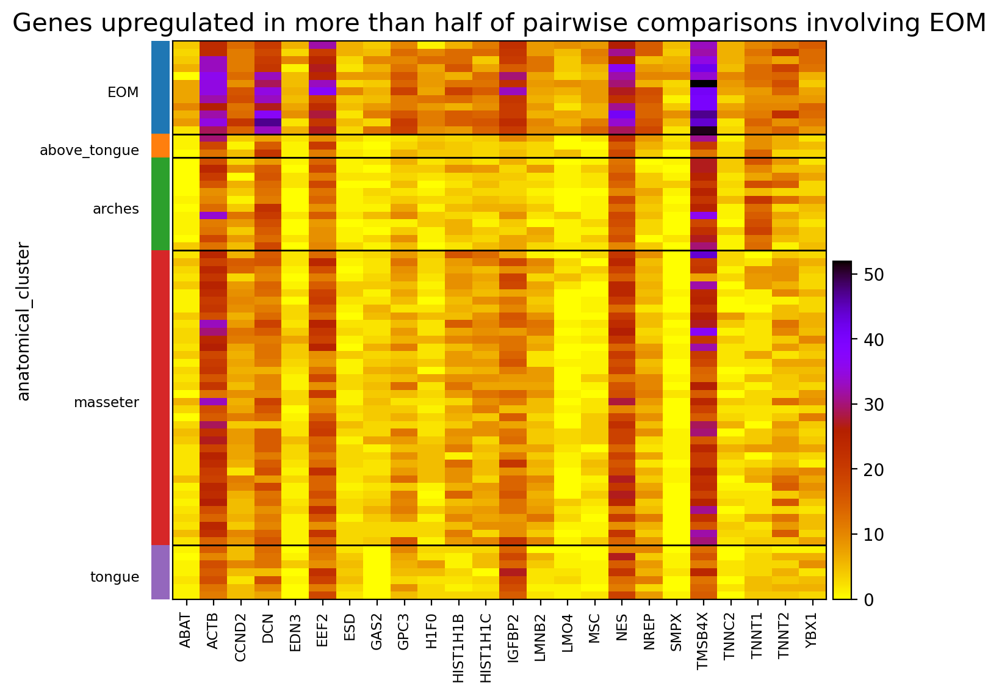

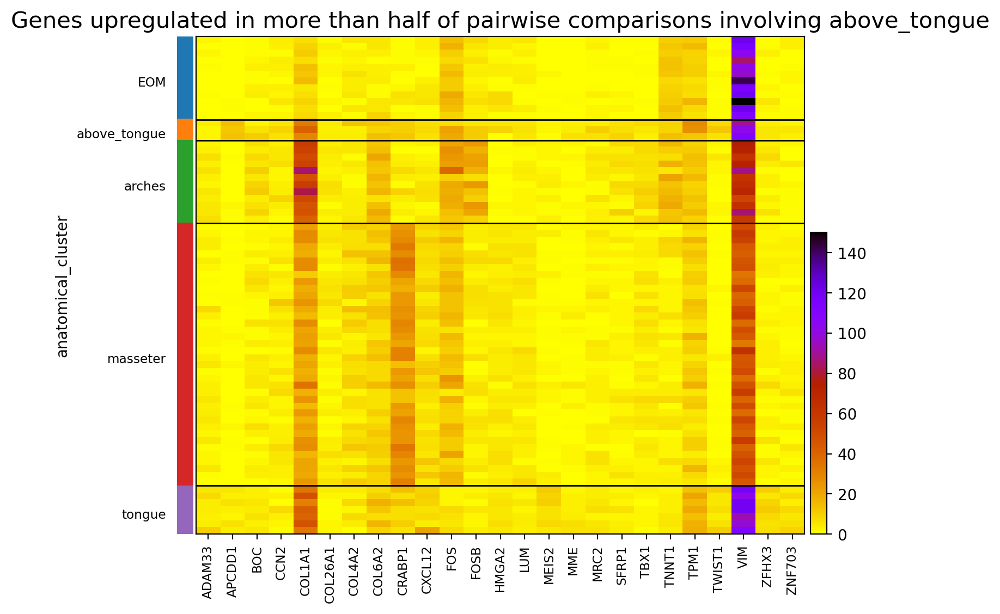

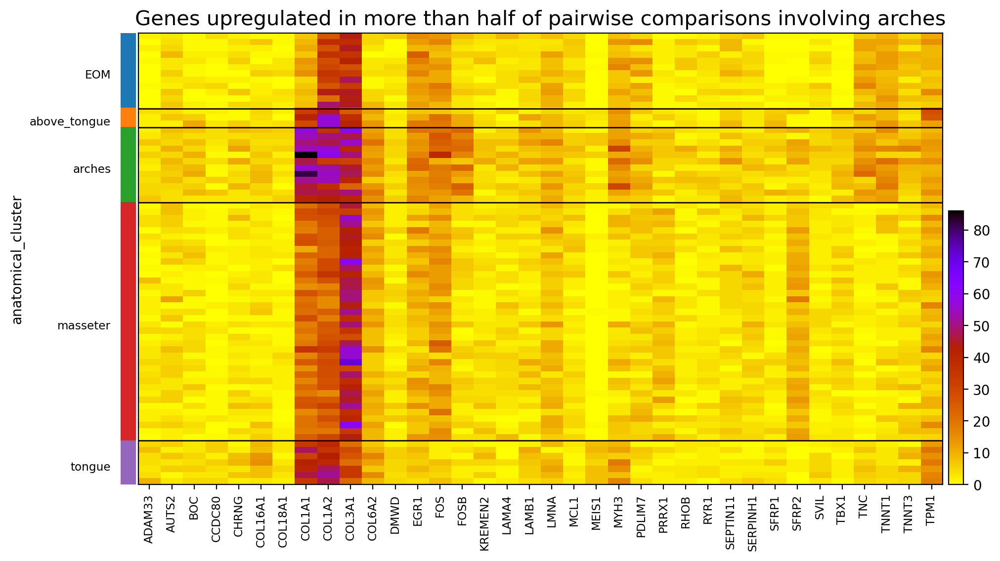

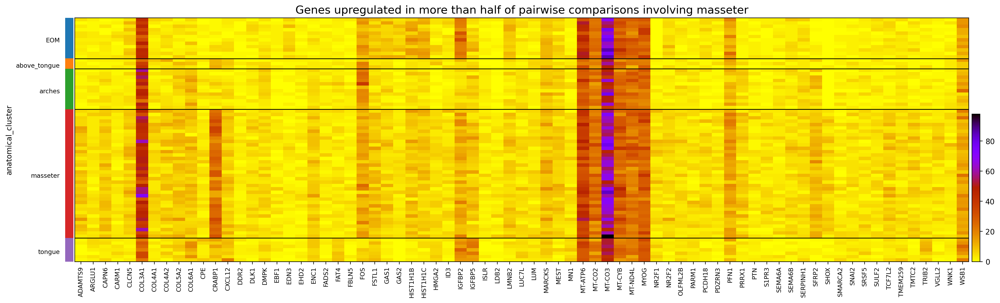

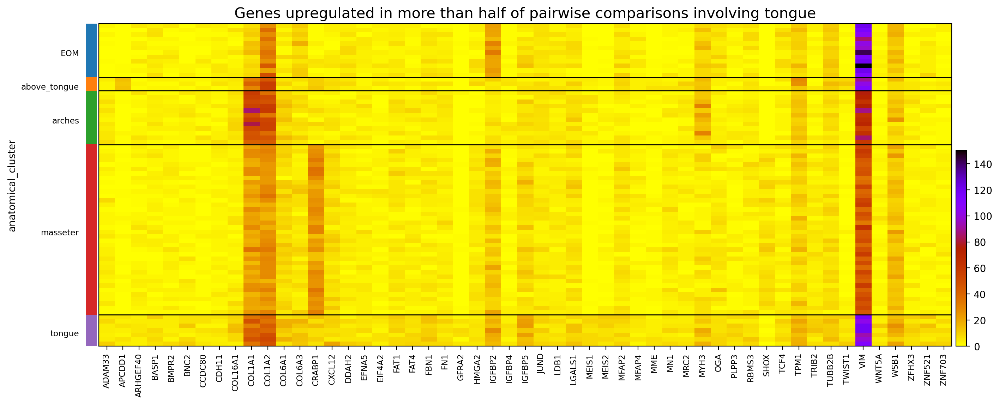

In [39]:
for cluster, top_markers_df in data_top_markers.items():
    
    genes=top_markers_df['gene'].values.tolist()
    heatmap=sc.pl.heatmap(
            adata=pdata_muscle,
            groupby="anatomical_cluster",
            var_names=genes,
            cmap="gnuplot_r",
            show_gene_labels=True, 
            show=False) 
    heatmap["heatmap_ax"].set_title(f"Genes upregulated in more than half of pairwise comparisons involving {cluster}", fontsize=15)
    plt.show()